Last updated on July 17, 2018

# Demo script for generating examples for display in UW-Madison's colloquium

This is a complimentary demo script that can be used to implement the local wave activity, fluxes and flux convergence/divergence computation required in the analyses presented in Nakamura and Huang, Atmospheric Blocking as a Traffic Jam in the Jet Stream. Science. (2018)

This notebook demonstrate how to compute local wave activity and all the flux terms in equations (2) and (3) in NH2018 with the updated functionality in the python package `hn2016_falwa`. To run the script, please install the 
package `hn2016_falwa` using
```
python setup.py install
```
after cloning the [GitHub repo](http://github.com/csyhuang/hn2016_falwa).

The functionalities are enhanced and included in the class object `QGField` under `hn2016_falwa.oopinterface`. Please refer to the [documentation](http://hn2016-falwa.readthedocs.io/) (search `QGField`) or the end of this notebook for the input/methods this class provides.

Please [raise an issue in the GitHub repo](https://github.com/csyhuang/hn2016_falwa/issues) or contact Clare S. Y. Huang (csyhuang@uchicago.edu) if you have any questions or suggestions regarding the package.

In [1]:
import os
from math import pi
import datetime as dt

import numpy as np
from numpy import dtype
from netCDF4 import Dataset
import matplotlib.pyplot as plt

%matplotlib inline
from hn2016_falwa.oopinterface import QGField
import hn2016_falwa.utilities as utilities
from hn2016_falwa.download_data import ERAICode, retrieve_erai

### Specify the date for downloading

In [2]:
start_date = dt.date(2012,10,16)
end_date = dt.date(2012,11,15)

if not os.path.exists("2012-10-16_to_2012-11-15_uvt.nc"):
    download_status = retrieve_erai(
        start_date,
        end_date,
        'uvt',
        [ERAICode.u, ERAICode.v, ERAICode.t]
    )

# Load ERA-Interim reanalysis data retrieved from ECMWF server
The sample script in this directory `download_example.py` include the code to retrieve zonal wind field U, meridional
wind field V and temperature field T at various pressure levels. Given that you have an account on ECMWF server and
have the `ecmwfapi` package installed, you can run the scripts to download data from there:
```
python download_example.py
```

In [3]:
!ls

2005-01-23_to_2005-01-30_output_20190907.nc  lwa_qgpv_240hPa_2012_10_30_12.png
2005-01-23_to_2005-01-30_t.nc		     lwa_qgpv_240hPa_2012_10_30_18.png
2005-01-23_to_2005-01-30_u.nc		     lwa_qgpv_240hPa_2012_10_31_00.png
2005-01-23_to_2005-01-30_v.nc		     lwa_qgpv_240hPa_2012_10_31_06.png
2012-10-16_to_2012-11-15_output_20190907.nc  lwa_qgpv_240hPa_2012_10_31_12.png
2012-10-16_to_2012-11-15_uvt.nc		     lwa_qgpv_240hPa_2012_10_31_18.png
2012-10-28_to_2012-10-31_output_20190907.nc  lwa_qgpv_240hPa_2012_11_01_00.png
2012-10-28_to_2012-10-31_uvt.nc		     lwa_qgpv_240hPa_2012_11_01_06.png
demo_script_for_nh2018.ipynb		     lwa_qgpv_240hPa_2012_11_01_12.png
demo_script_for_sandy_days.ipynb	     lwa_qgpv_240hPa_2012_11_01_18.png
download_example.py			     lwa_qgpv_240hPa_2012_11_02_00.png
download_sandy_days.py			     lwa_qgpv_240hPa_2012_11_02_06.png
lwa_qgpv_240hPa_2012_10_16_00.png	     lwa_qgpv_240hPa_2012_11_02_12.png
lwa_qgpv_240hPa_2012_10_16_06.png	     lwa_qgpv_240hPa_2012_11_02_18.p

In [4]:
netcdf_fname = '2012-10-16_to_2012-11-15_uvt.nc'
print('netcdf_fname = {}'.format(netcdf_fname))

# --- Load the zonal wind and QGPV at 240hPa --- #
u_file = Dataset(netcdf_fname, mode='r')
v_file = Dataset(netcdf_fname, mode='r')
t_file = Dataset(netcdf_fname, mode='r')

time_array = u_file.variables['time'][:]
time_units = u_file.variables['time'].units
time_calendar = u_file.variables['time'].calendar
ntimes = time_array.shape[0]

print('Dimension of time: {}'.format(time_array.size))

netcdf_fname = 2012-10-16_to_2012-11-15_uvt.nc
Dimension of time: 124


# Load the dimension arrays
In this version, the `QGField` object takes only:
- latitude array in degree ascending order, and 
- pressure level in hPa in decending order (from ground to aloft).

In [5]:
xlon = u_file.variables['longitude'][:]

# latitude has to be in ascending order
ylat = u_file.variables['latitude'][:]
if np.diff(ylat)[0]<0:
    print('Flip ylat.')
    ylat = ylat[::-1]

# pressure level has to be in descending order (ascending height)
plev = u_file.variables['level'][:]
if np.diff(plev)[0]>0:
    print('Flip plev.')    
    plev = plev[::-1]

nlon = xlon.size
nlat = ylat.size
nlev = plev.size

Flip ylat.
Flip plev.


In [6]:
clat = np.cos(np.deg2rad(ylat))     # cosine latitude
p0 = 1000.                          # surface pressure [hPa]
height = np.arange(0,48001,1000)    # pseudoheight [m]
dz = 1000.                          # differential height element
dphi = np.diff(ylat)[0]*pi/180.     # differential latitudinal element
dlambda = np.diff(xlon)[0]*pi/180.  # differential latitudinal element
hh = 7000.                          # scale height
cp = 1004.                          # heat capacity of dry air
rr = 287.                           # gas constant
omega = 7.29e-5                     # rotation rate of the earth
aa = 6.378e+6                       # earth radius
kmax = 49                           # number of grid points for vertical extrapolation (dimension of height)
prefactor = 6500.                   # integrated sum of density from ground to aloft
npart = nlat                        # number of partitions to construct the equivalent latitude grids
maxits = 100000                     # maximum number of iteration in the SOR solver to solve for reference state
tol = 1.e-5                         # tolerance that define convergence of solution
rjac = 0.95                         # spectral radius of the Jacobi iteration in the SOR solver.              
jd = nlat//2+1                      # (one plus) index of latitude grid point with value 0 deg
                                    # This is to be input to fortran code. The index convention is different.


# Create a netCDF file to store output

A netCDF file with same number of time steps in the input file is created to store all the computed quantities.

In [7]:
# === Outputing files ===
output_fname = '2012-10-16_to_2012-11-15_output_20190907.nc'
output_file = Dataset(output_fname, 'w')
output_file.createDimension('levelist',kmax)
output_file.createDimension('latitude',nlat)
output_file.createDimension('longitude',nlon)
output_file.createDimension('time',ntimes) 
plevs = output_file.createVariable('levelist',dtype('float32').char,('levelist',)) # Define the coordinate variables
lats = output_file.createVariable('latitude',dtype('float32').char,('latitude',)) # Define the coordinate variables
lons = output_file.createVariable('longitude',dtype('float32').char,('longitude',))
times = output_file.createVariable('time',dtype('int').char,('time',))    
plevs.units = 'hPa' 
lats.units = 'degrees_north'
lons.units = 'degrees_east'
times.units = time_units
times.calendar = time_calendar
plevs[:] = p0 * np.exp(-height/hh)
lats[:]  = ylat 
lons[:]  = xlon
times[:] = time_array
qgpv = output_file.createVariable('qgpv',dtype('float32').char,('time','levelist','latitude','longitude'))
qgpv.units = '1/s' 
interpolated_u = output_file.createVariable('interpolated_u',dtype('float32').char,('time','levelist','latitude','longitude'))
interpolated_u.units = 'm/s' 
interpolated_v = output_file.createVariable('interpolated_v',dtype('float32').char,('time','levelist','latitude','longitude'))
interpolated_v.units = 'm/s'
interpolated_theta = output_file.createVariable('interpolated_theta',dtype('float32').char,('time','levelist','latitude','longitude'))
interpolated_theta.units = 'K' 
qref = output_file.createVariable('qref',dtype('float32').char,('time','levelist','latitude'))
qref.units = '1/s' 
uref = output_file.createVariable('uref',dtype('float32').char,('time','levelist','latitude'))
uref.units = 'm/s' 
ptref = output_file.createVariable('ptref',dtype('float32').char,('time','levelist','latitude'))
ptref.units = 'K' 
lwa = output_file.createVariable('lwa',dtype('float32').char,('time','levelist','latitude','longitude'))
lwa.units = 'm/s'
adv_flux_f1 = output_file.createVariable('Zonal advective flux F1',dtype('float32').char,('time','latitude','longitude'))
adv_flux_f1.units = 'm**2/s**2'    
adv_flux_f2 = output_file.createVariable('Zonal advective flux F2',dtype('float32').char,('time','latitude','longitude'))
adv_flux_f2.units = 'm**2/s**2'  
adv_flux_f3 = output_file.createVariable('Zonal advective flux F3',dtype('float32').char,('time','latitude','longitude'))
adv_flux_f3.units = 'm**2/s**2'  
adv_flux_conv = output_file.createVariable('Zonal advective flux Convergence -Div(F1+F2+F3)',dtype('float32').char,('time','latitude','longitude'))
adv_flux_conv.units = 'm/s**2'  
divergence_eddy_momentum_flux = output_file.createVariable('Eddy Momentum Flux Divergence',dtype('float32').char,('time','latitude','longitude'))
divergence_eddy_momentum_flux.units = 'm/s**2'  
meridional_heat_flux = output_file.createVariable('Low-level Meridional Heat Flux',dtype('float32').char,('time','latitude','longitude'))
meridional_heat_flux.units = 'm/s**2' 
lwa_baro = output_file.createVariable('lwa_baro',dtype('float32').char,('time','latitude','longitude'))
lwa_baro.units = 'm/s' 
u_baro = output_file.createVariable('u_baro',dtype('float32').char,('time','latitude','longitude'))
u_baro.units = 'm/s' 

# Set the level of pressure and the timestamp to display below

In [8]:
tstamp = [dt.datetime(start_date.year,start_date.month,start_date.day,0,0) + dt.timedelta(seconds=6*3600) * tt for tt in range(ntimes)]
plev_selected = 10 # selected pressure level to display
tstep_selected = 0 # selected time step to display

# Loop through the input file and store all the computed quantities in a netCDF file

In [9]:
for tstep in range(ntimes):
    
    uu = u_file.variables['u'][tstep, ::-1, ::-1, :].data
    vv = v_file.variables['v'][tstep, ::-1, ::-1, :].data
    tt = t_file.variables['t'][tstep, ::-1, ::-1, :].data

    qgfield_object = QGField(xlon, ylat, plev, uu, vv, tt)

    qgpv[tstep, :, :, :], interpolated_u[tstep, :, :, :], interpolated_v[tstep, :, :, :], \
        interpolated_theta[tstep, :, :, :], static_stability = qgfield_object.interpolate_fields()

    qref[tstep, :, (nlat//2):], uref[tstep, :, (nlat//2):], ptref[tstep, :, (nlat//2):] = \
        qgfield_object.compute_reference_states(northern_hemisphere_results_only=True)

    adv_flux_f1[tstep, (nlat//2):, :], \
    adv_flux_f2[tstep, (nlat//2):, :], \
    adv_flux_f3[tstep, (nlat//2):, :], \
    adv_flux_conv[tstep, (nlat//2):, :], \
    divergence_eddy_momentum_flux[tstep, (nlat//2):, :], \
    meridional_heat_flux[tstep, (nlat//2):, :], \
    lwa_baro[tstep, (nlat//2):, :], \
    u_baro[tstep, (nlat//2):, :], \
    lwa[tstep, :, (nlat//2):, :] \
        = qgfield_object.compute_lwa_and_barotropic_fluxes()    


In [10]:
ylat[(nlat//2)+16]

24.0

In [11]:
lwa_max = lwa[:, plev_selected, (nlat//2)+16:-1, :].max()
lwa_min = 0.0
lwa_cscale = np.linspace(lwa_min, lwa_max, 51, endpoint=True)
print(lwa_min, lwa_max)

0.0 372.33322


In [12]:
qgpv_max = qgpv[:, plev_selected, (nlat//2)+16:-1, :].max()
qgpv_min = qgpv[:, plev_selected, (nlat//2)+16:-1, :].min()
qgpv_cscale = np.linspace(qgpv_min, qgpv_max, 51, endpoint=True)
print(qgpv_min, qgpv_max)

-0.00014185996 0.00065400917


In [13]:
dt.datetime(2018,1,1,12).strftime(format='%Y-%m-%d-%H')

'2018-01-01-12'

In [16]:
# Create a directory
if not os.path.exists('output_graphs'):
    os.mkdir('output_graphs')

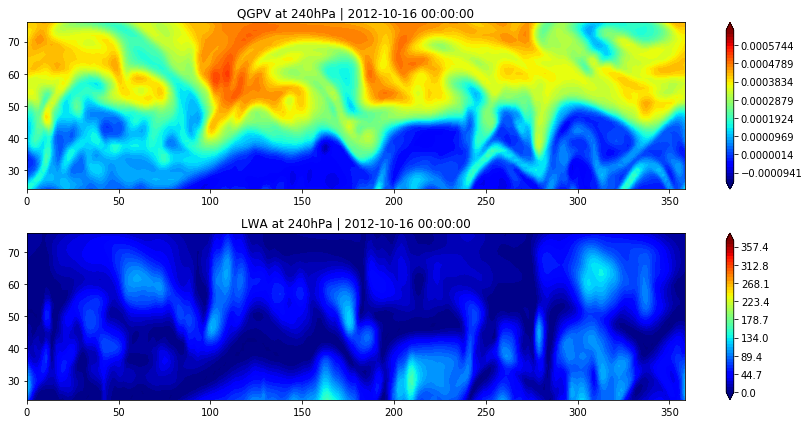

tstep = 0/124



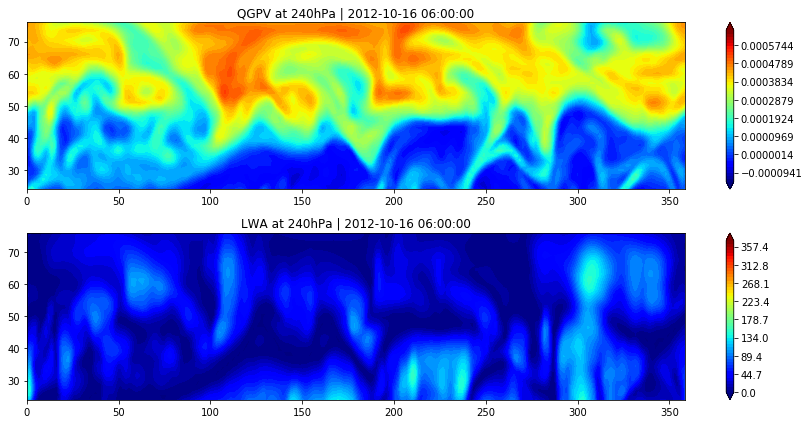

tstep = 1/124



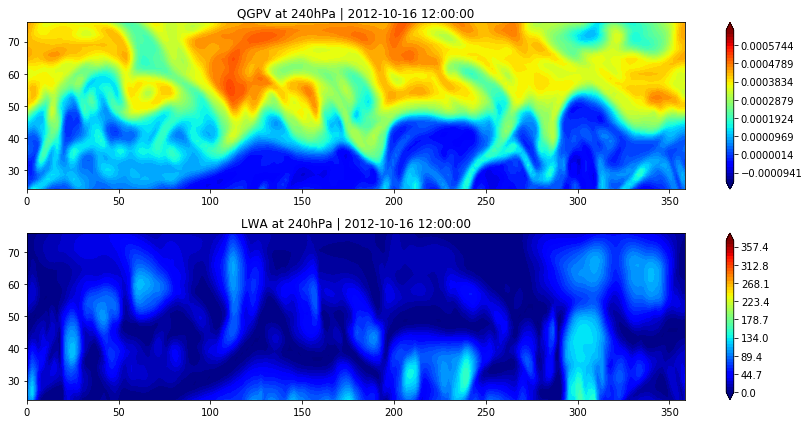

tstep = 2/124



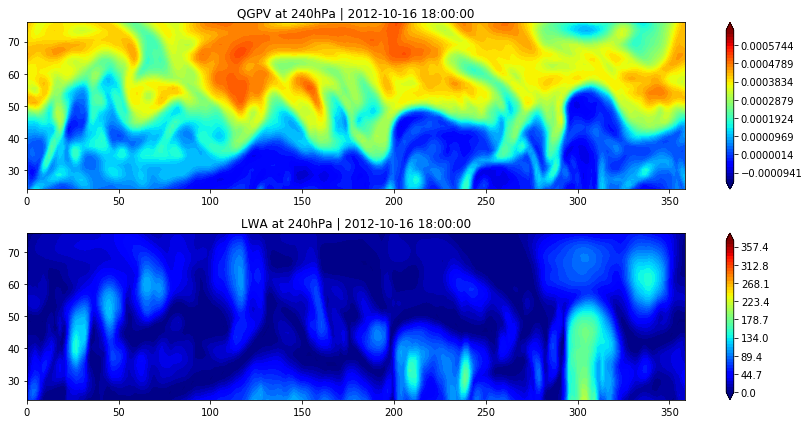

tstep = 3/124



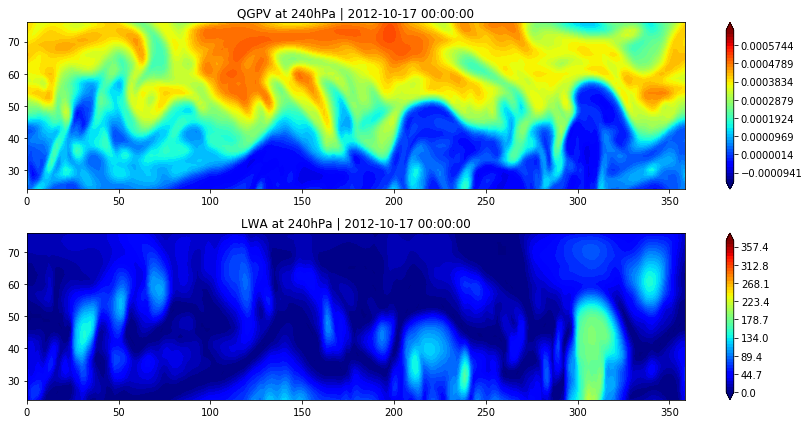

tstep = 4/124



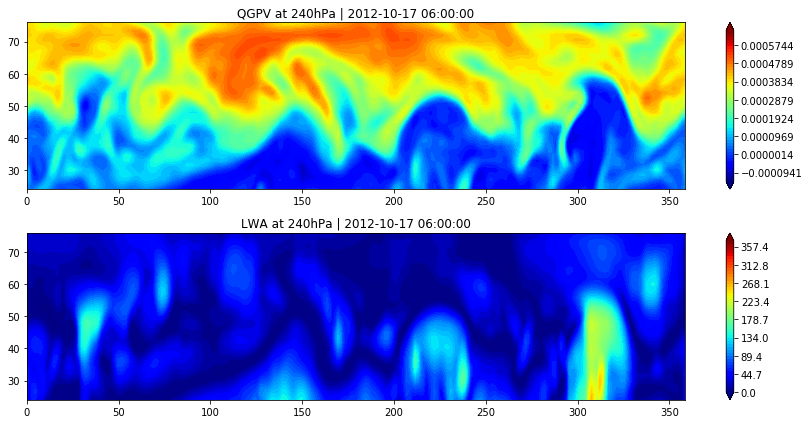

tstep = 5/124



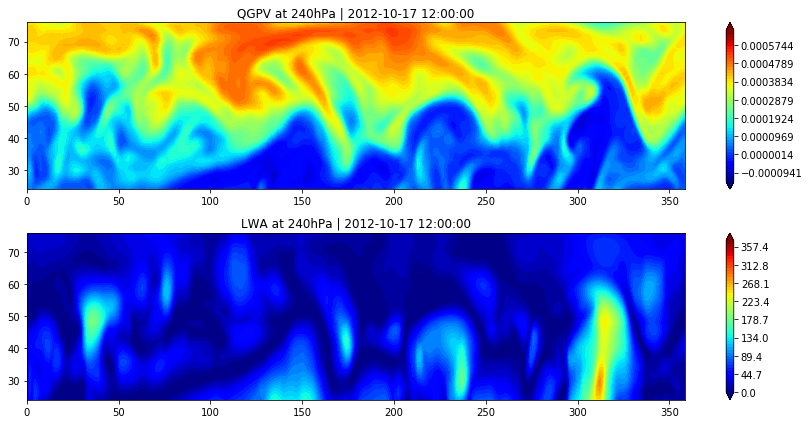

tstep = 6/124



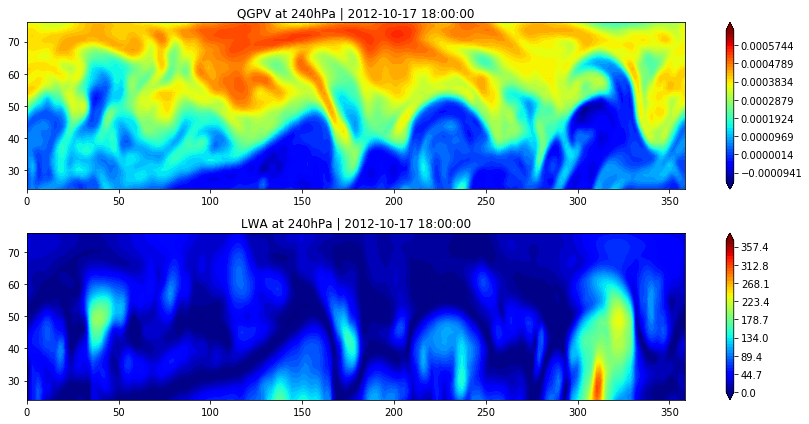

tstep = 7/124



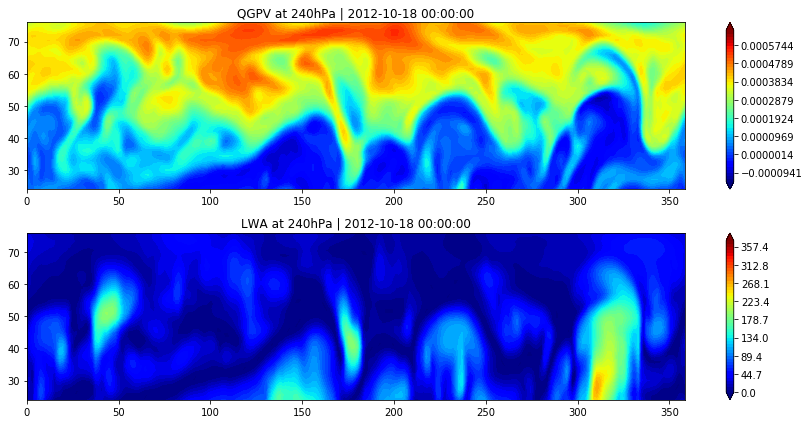

tstep = 8/124



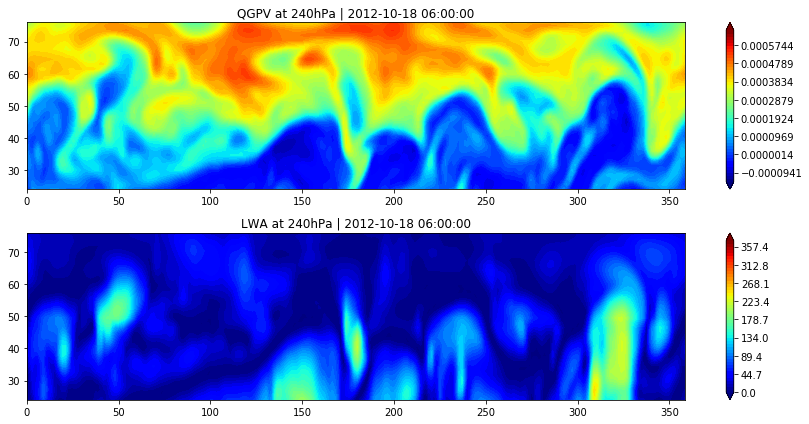

tstep = 9/124



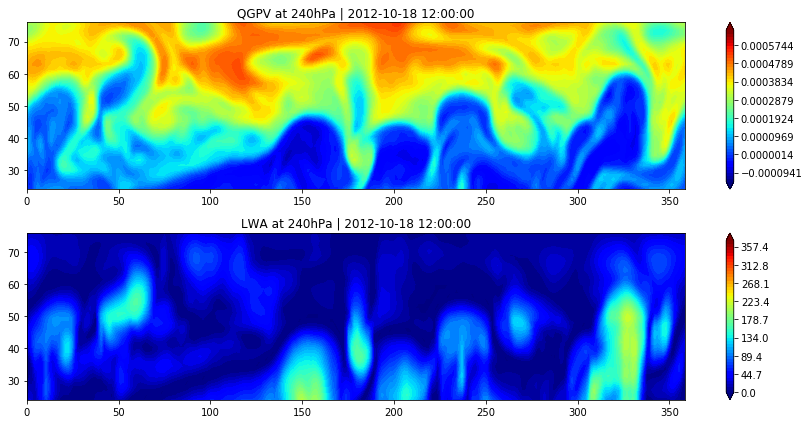

tstep = 10/124



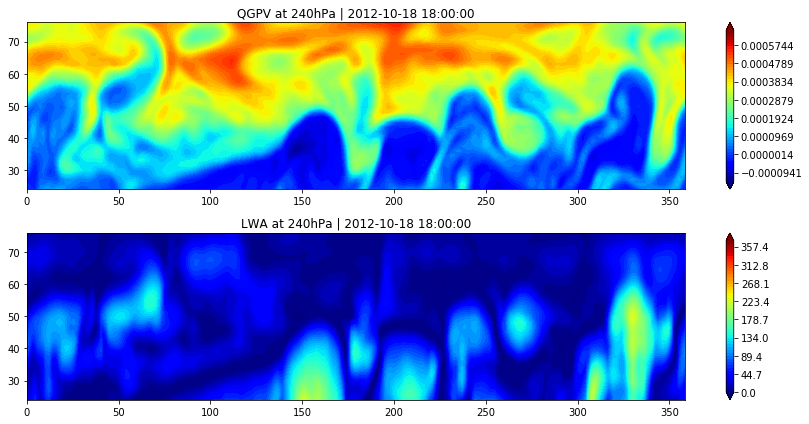

tstep = 11/124



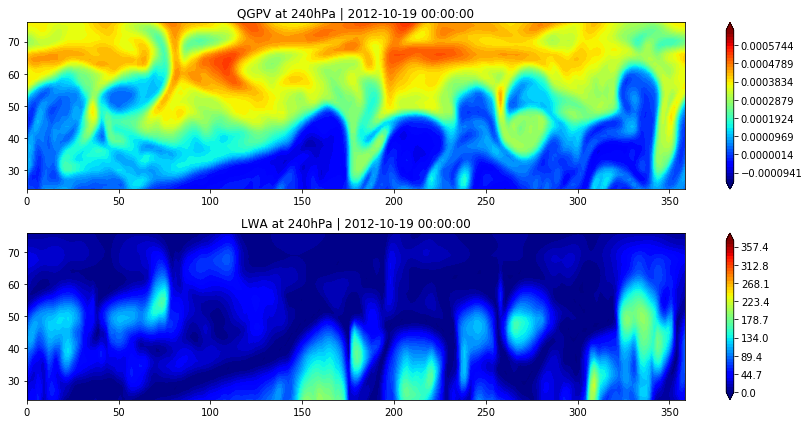

tstep = 12/124



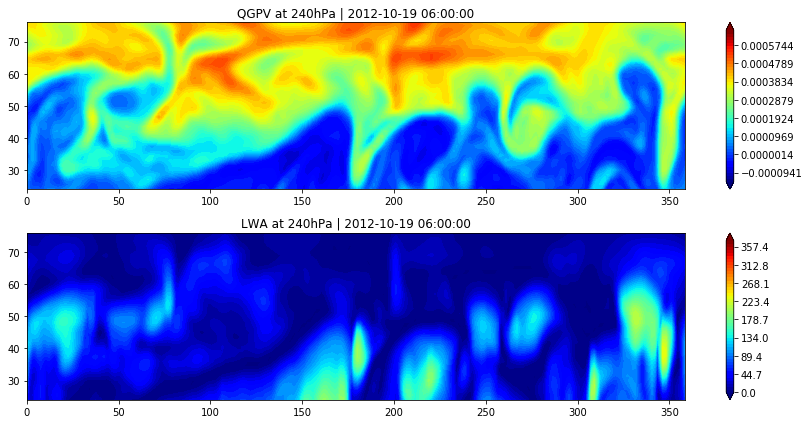

tstep = 13/124



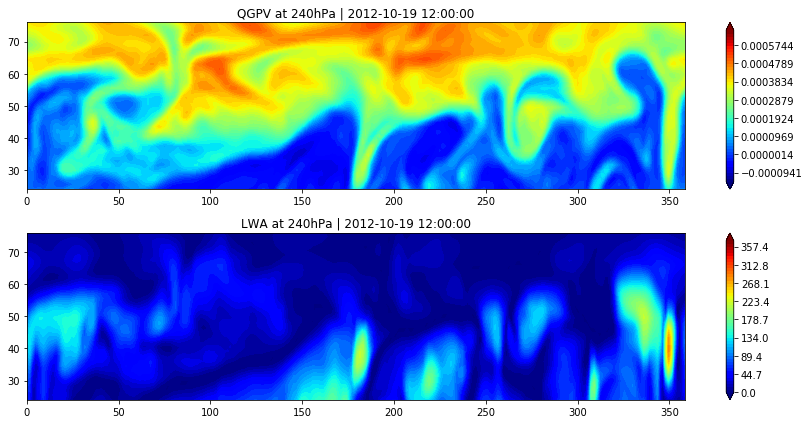

tstep = 14/124



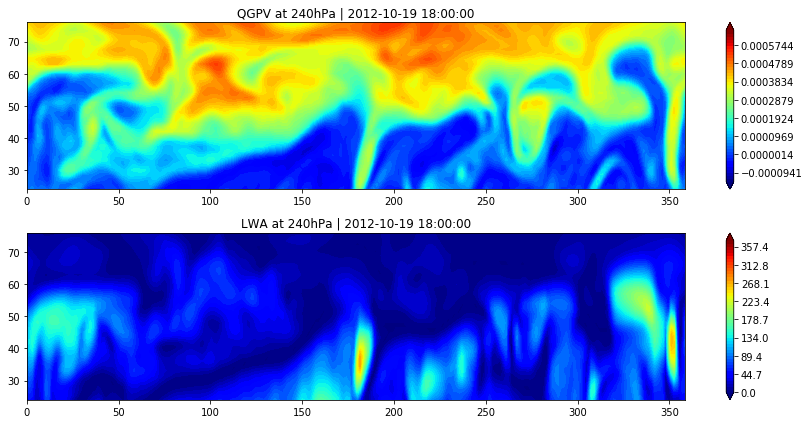

tstep = 15/124



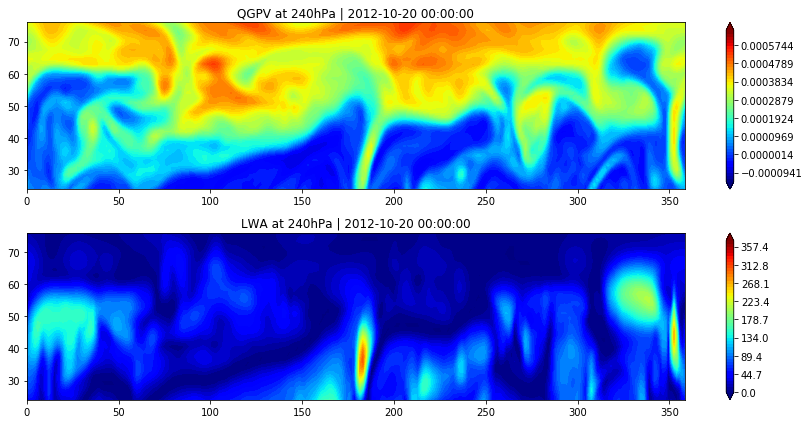

tstep = 16/124



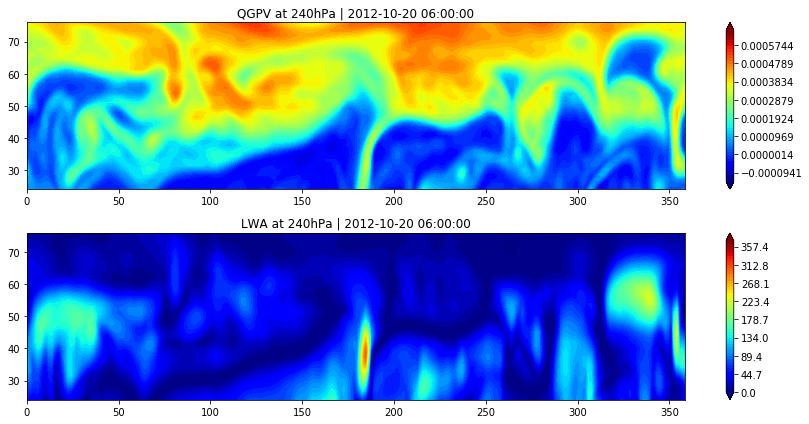

tstep = 17/124



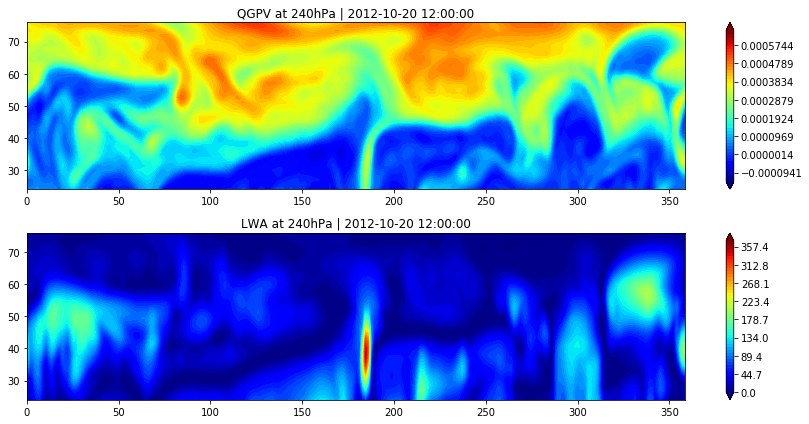

tstep = 18/124



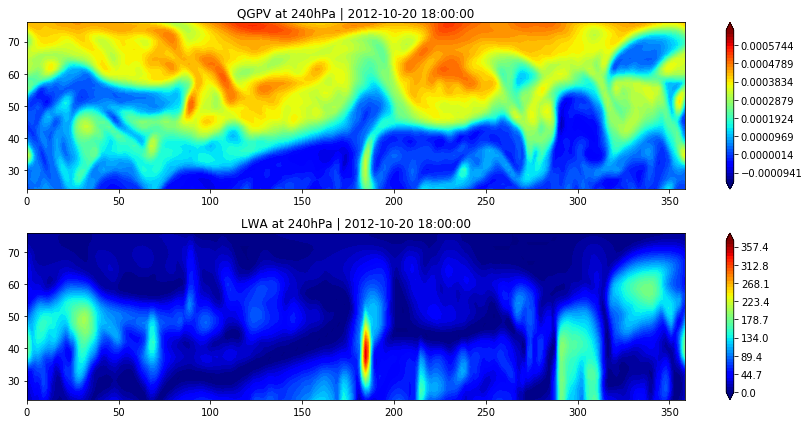

tstep = 19/124



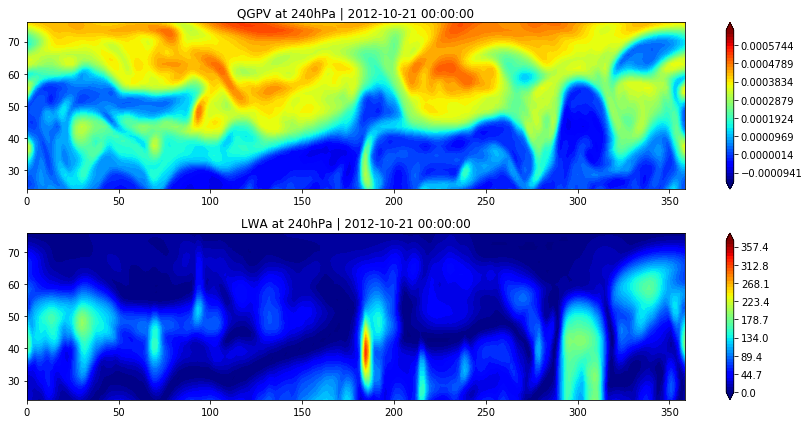

tstep = 20/124



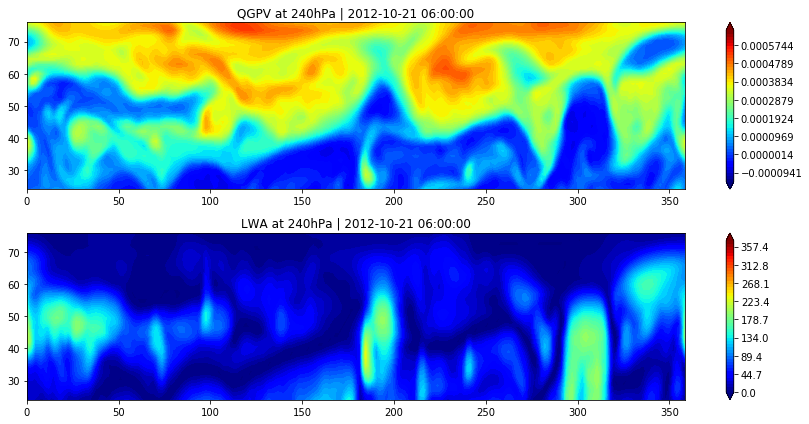

tstep = 21/124



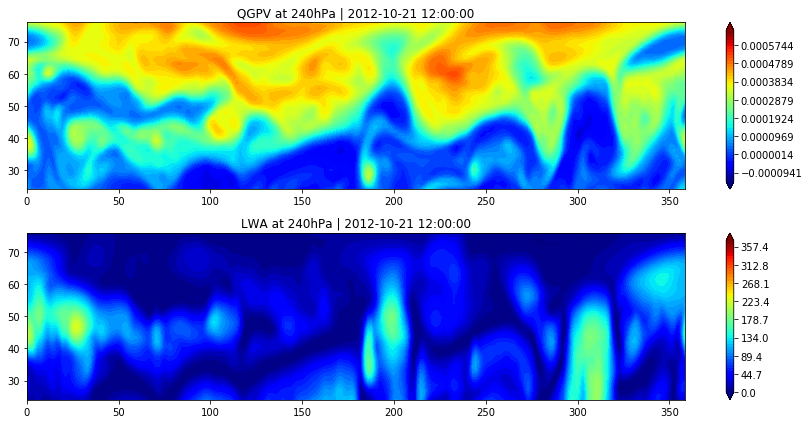

tstep = 22/124



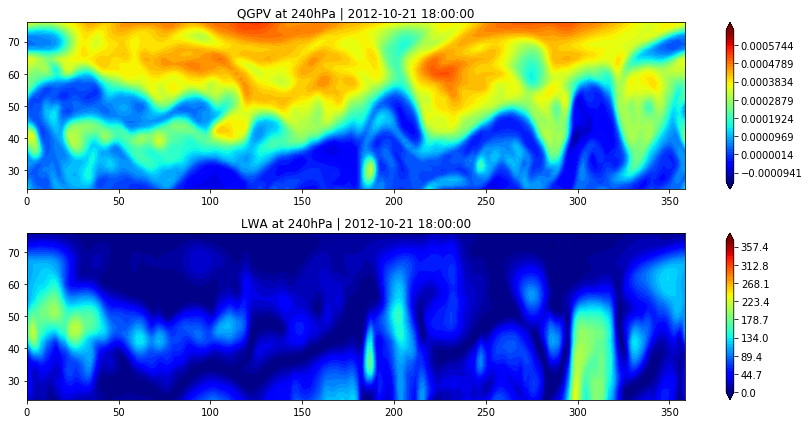

tstep = 23/124



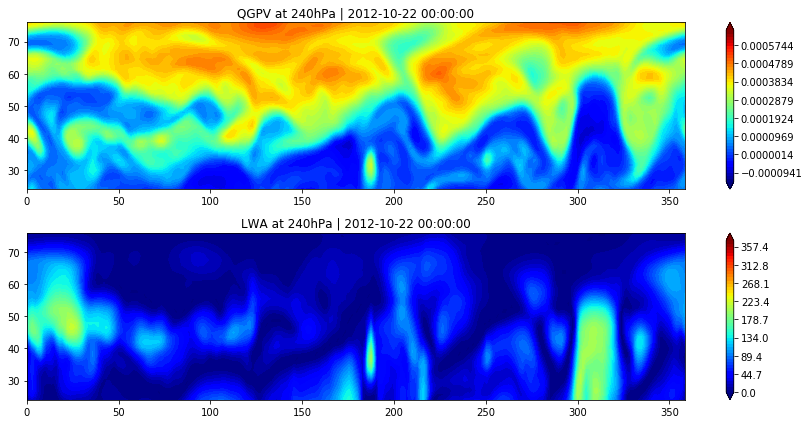

tstep = 24/124



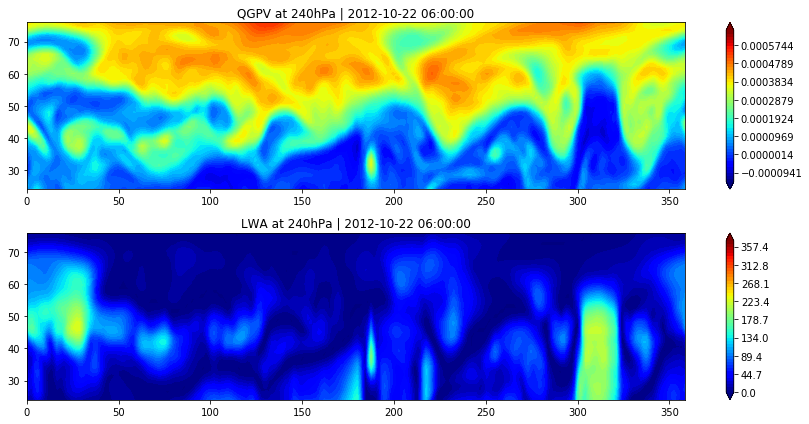

tstep = 25/124



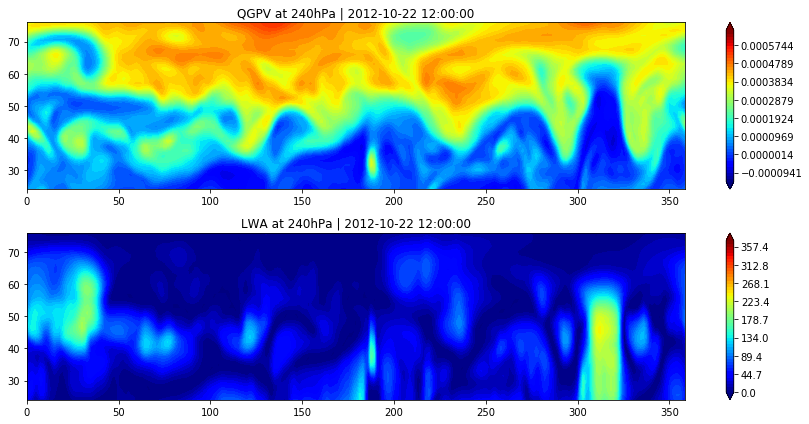

tstep = 26/124



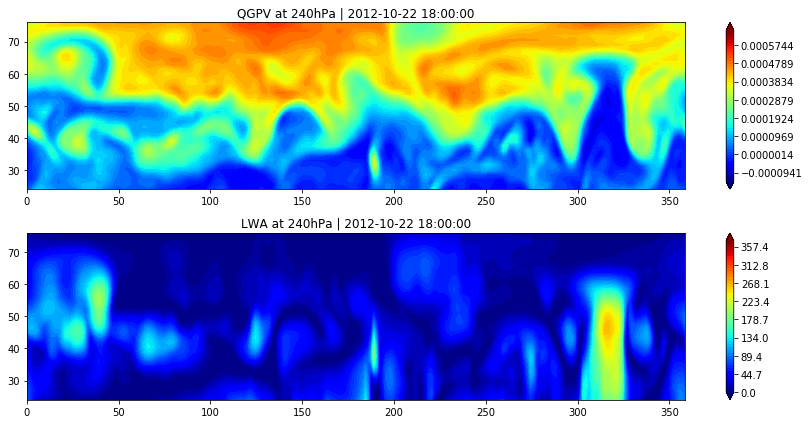

tstep = 27/124



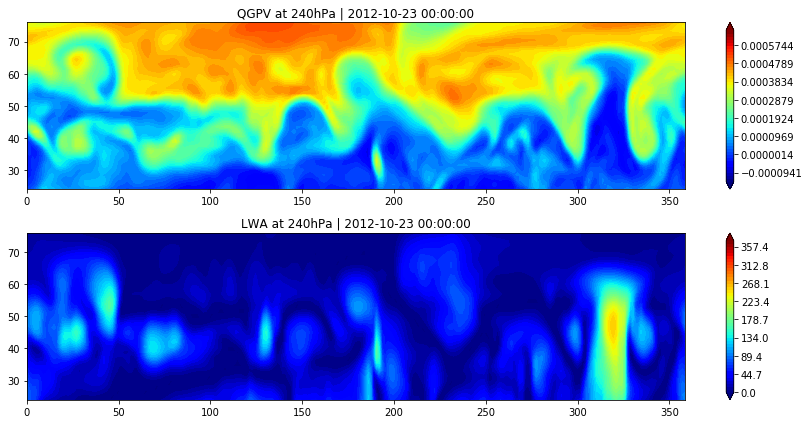

tstep = 28/124



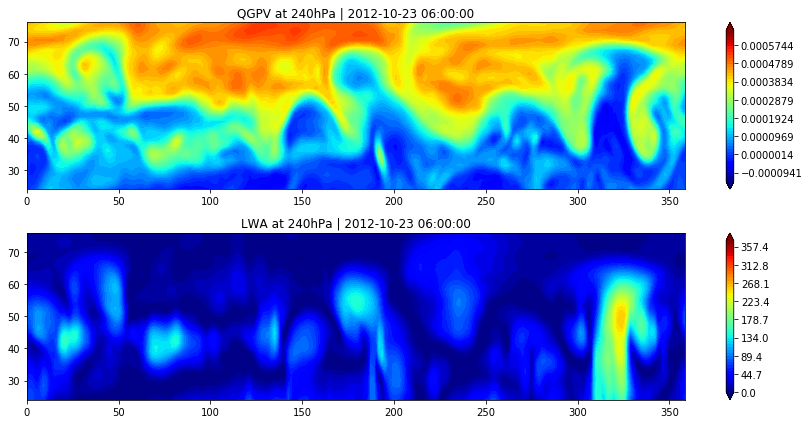

tstep = 29/124



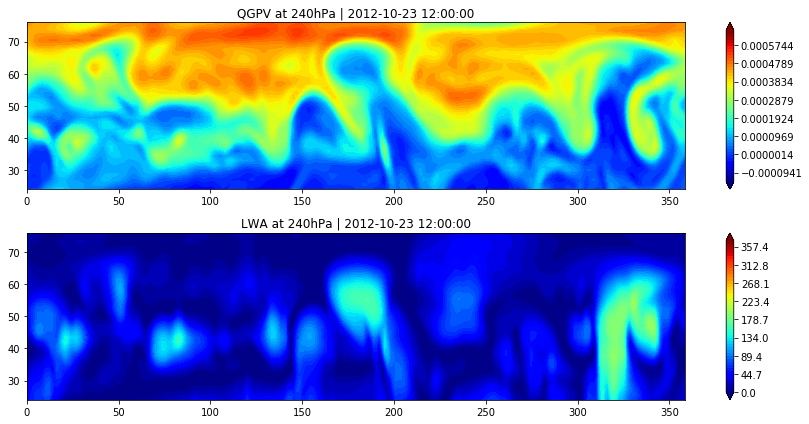

tstep = 30/124



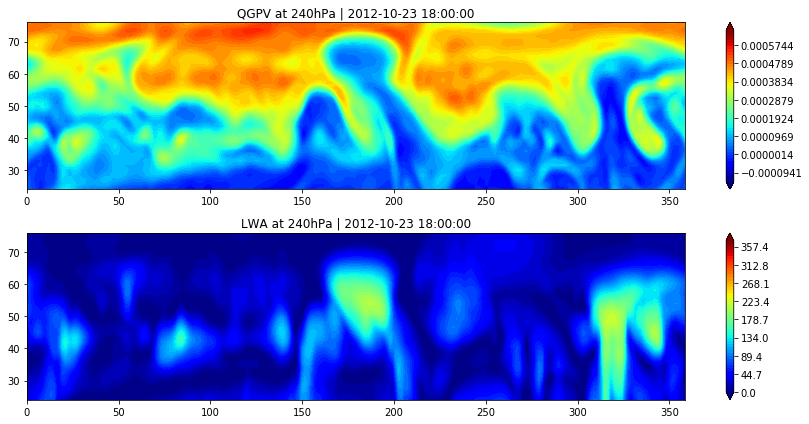

tstep = 31/124



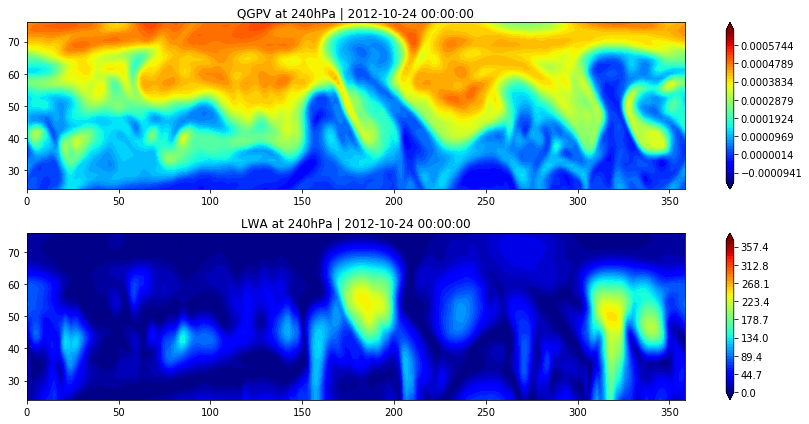

tstep = 32/124



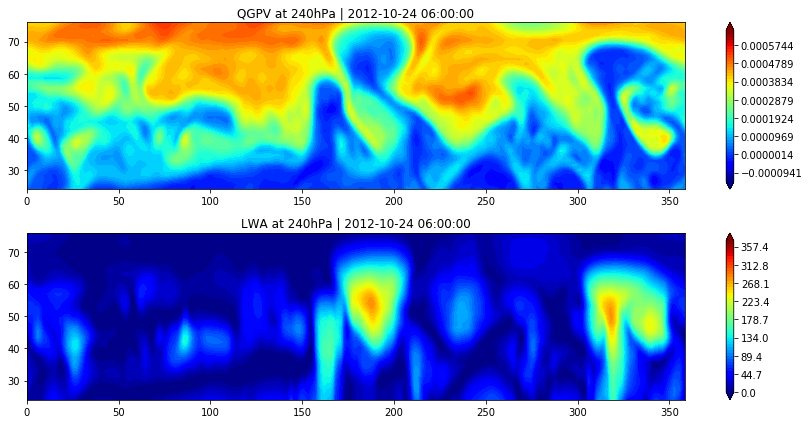

tstep = 33/124



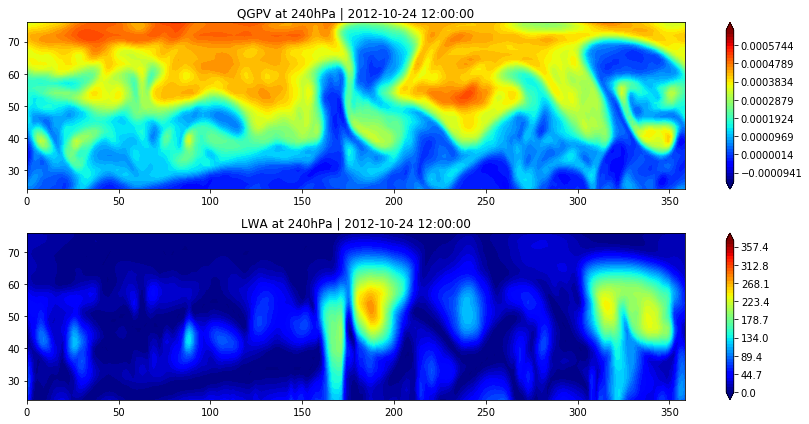

tstep = 34/124



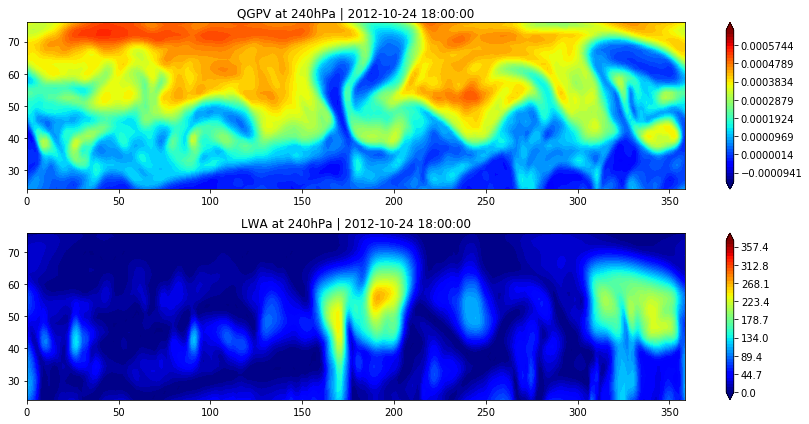

tstep = 35/124



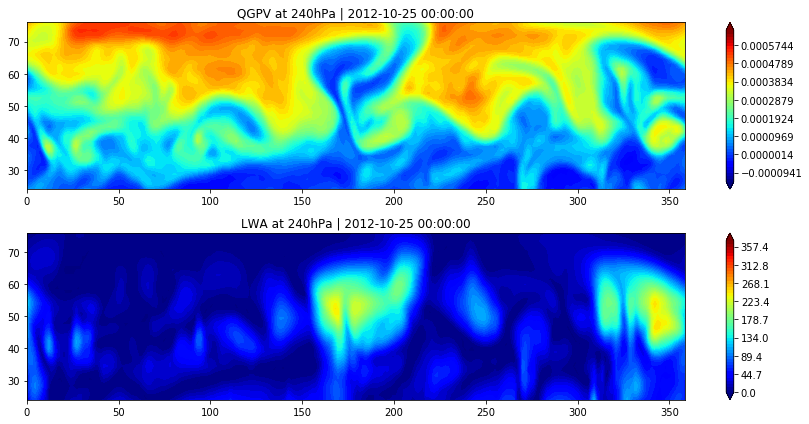

tstep = 36/124



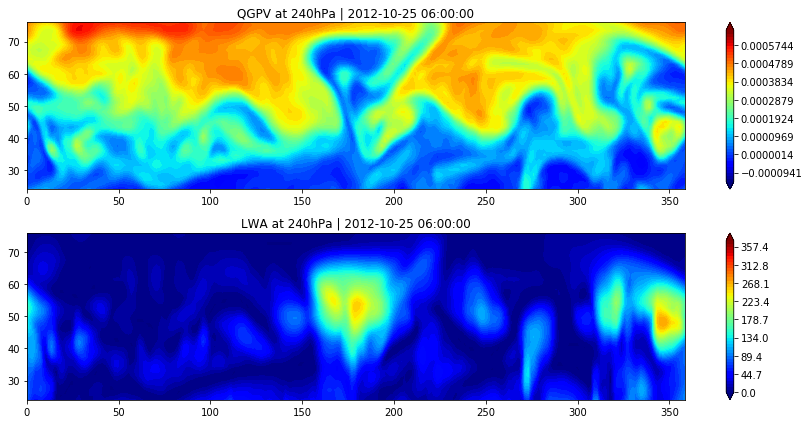

tstep = 37/124



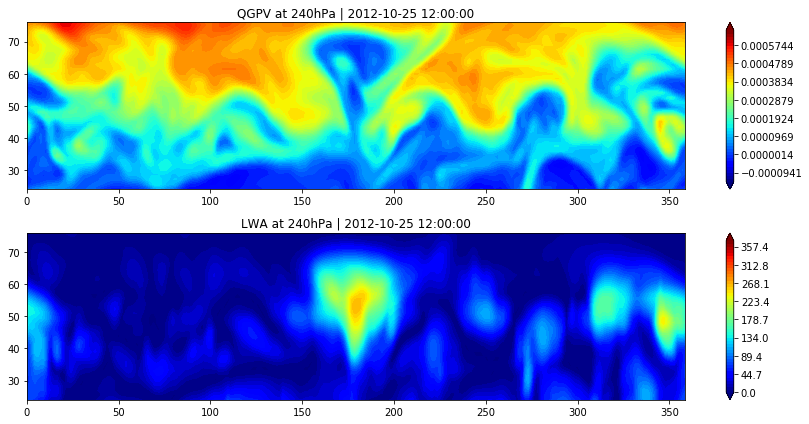

tstep = 38/124



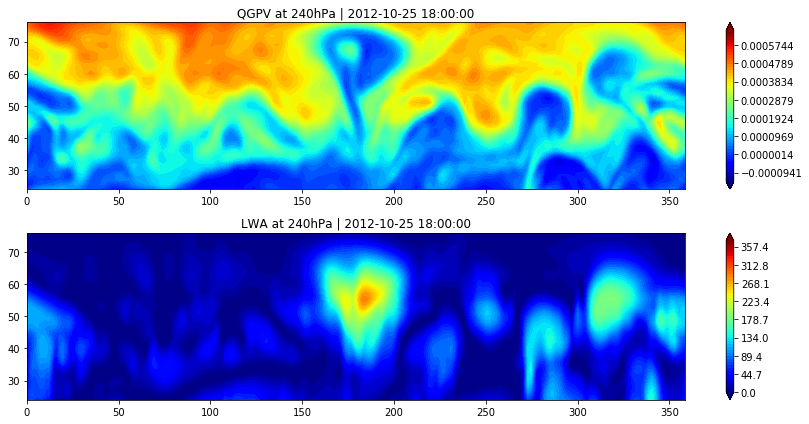

tstep = 39/124



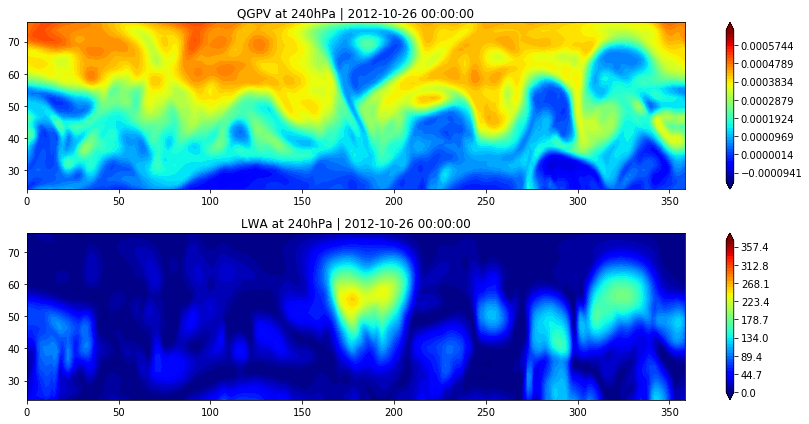

tstep = 40/124



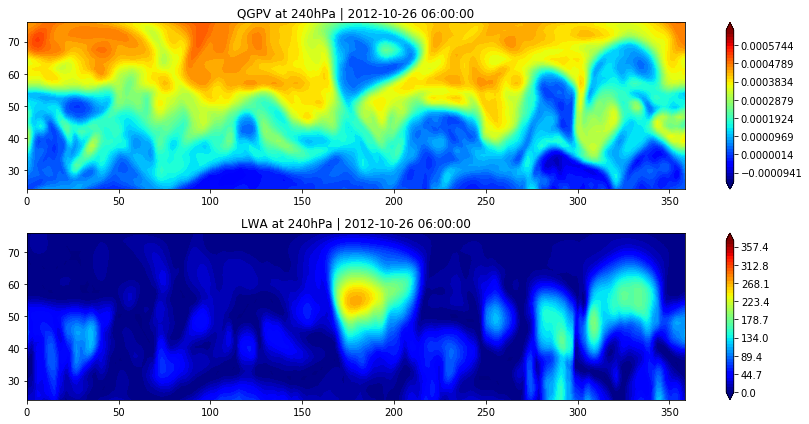

tstep = 41/124



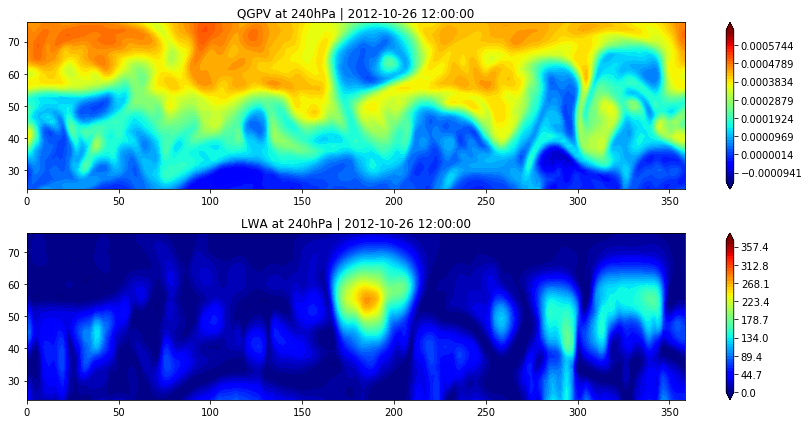

tstep = 42/124



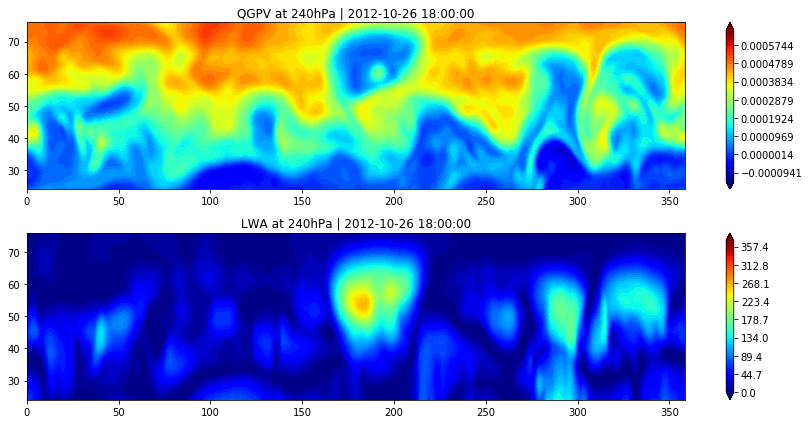

tstep = 43/124



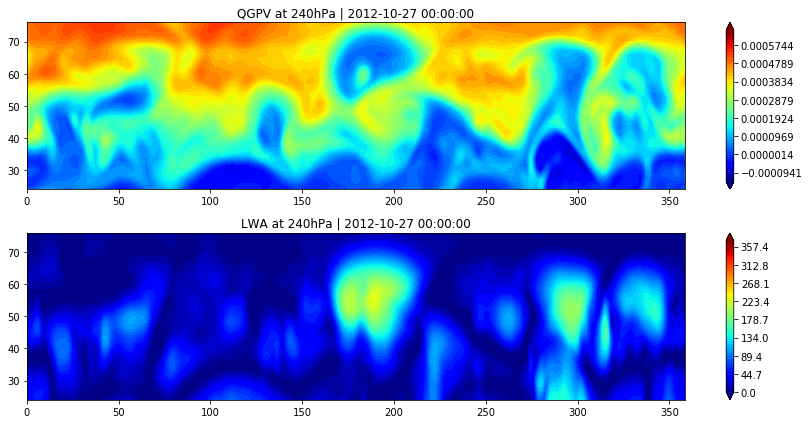

tstep = 44/124



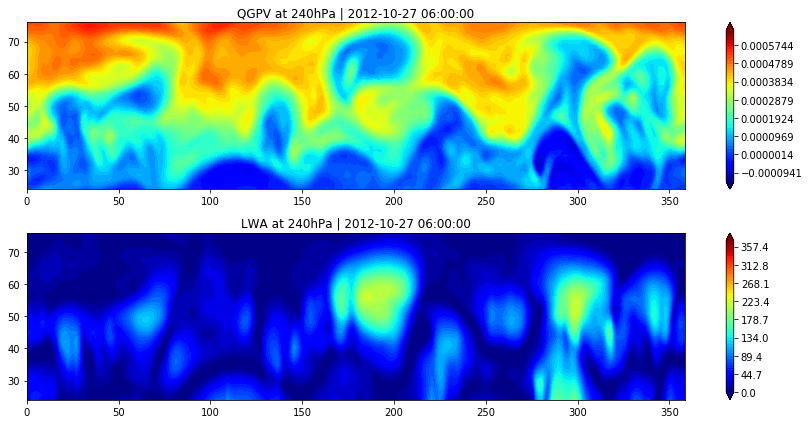

tstep = 45/124



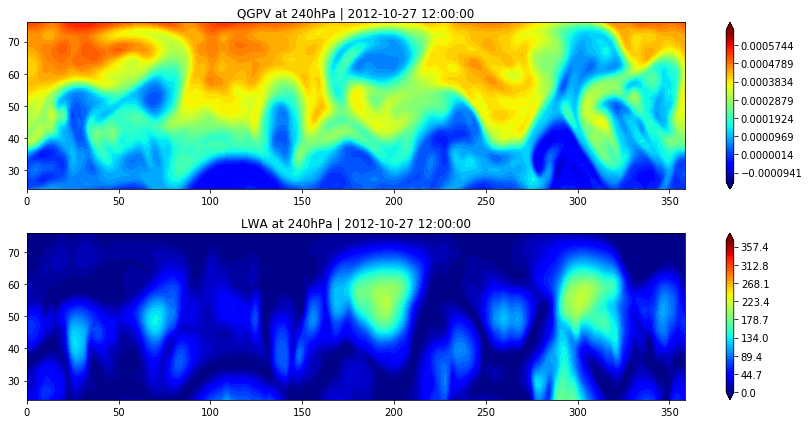

tstep = 46/124



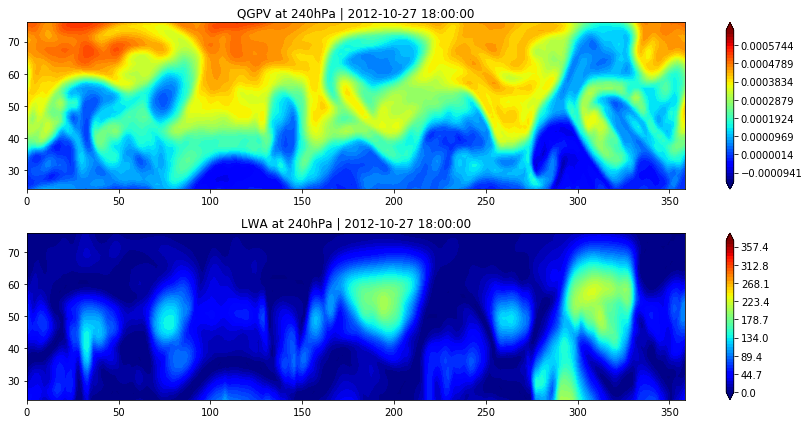

tstep = 47/124



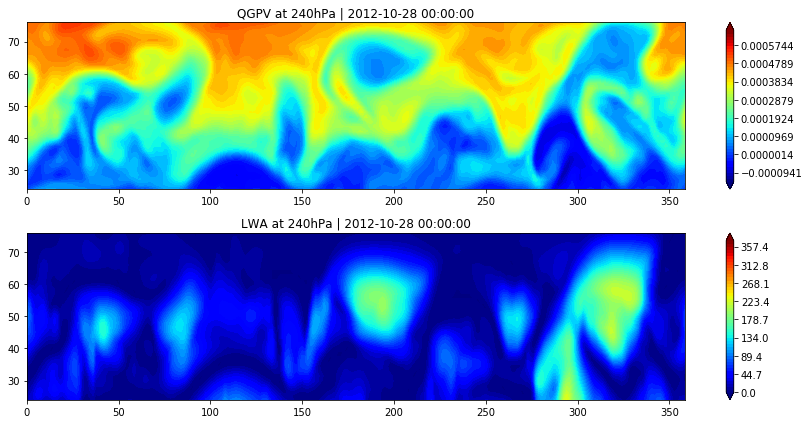

tstep = 48/124



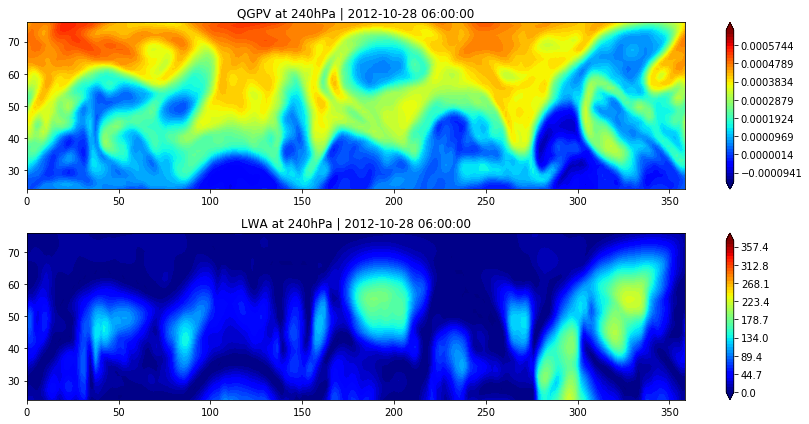

tstep = 49/124



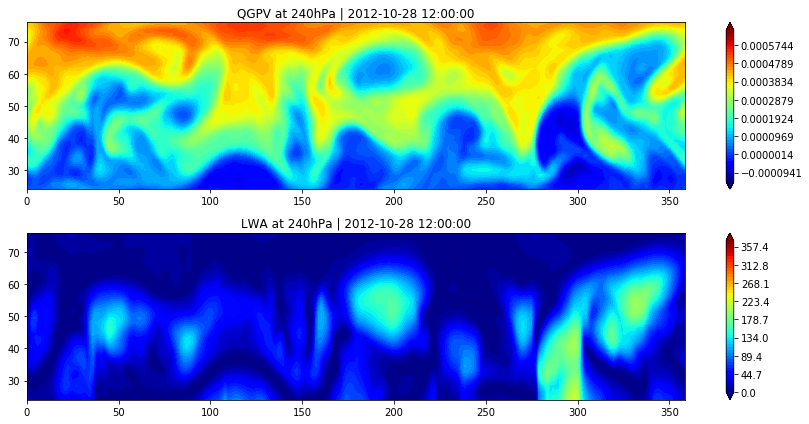

tstep = 50/124



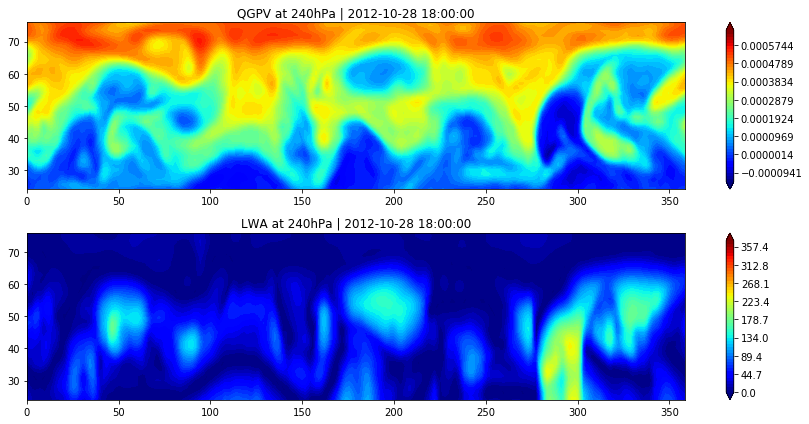

tstep = 51/124



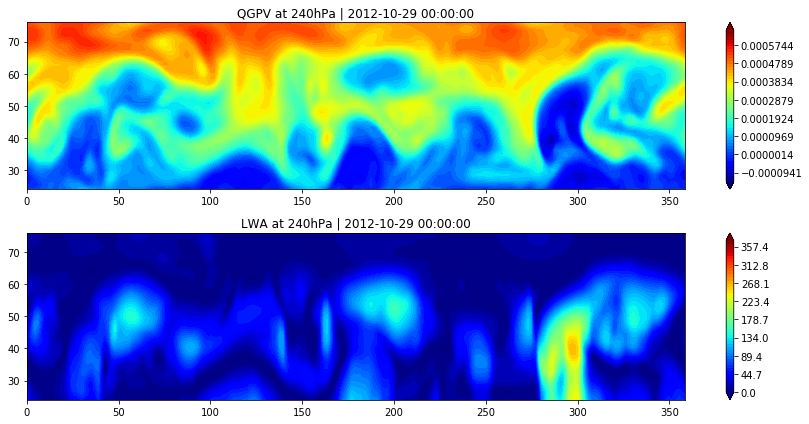

tstep = 52/124



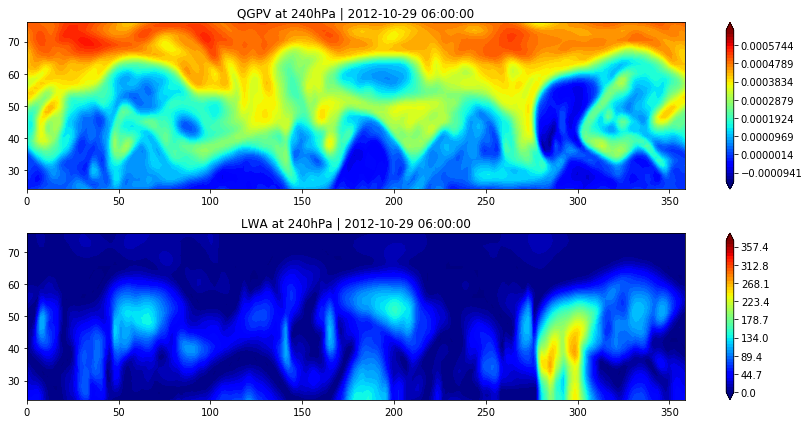

tstep = 53/124



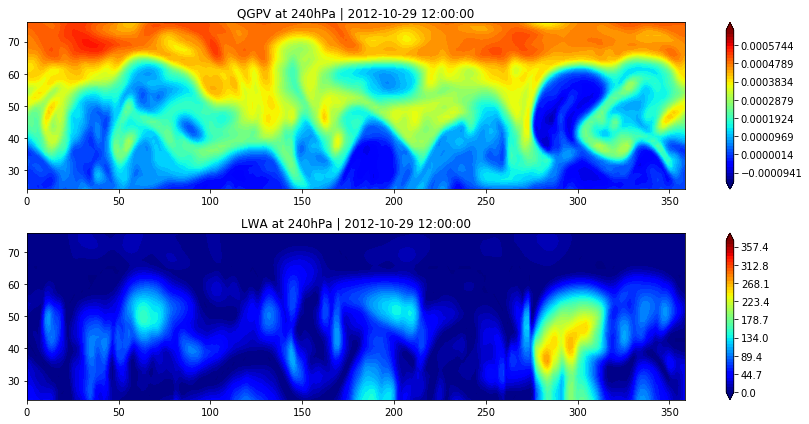

tstep = 54/124



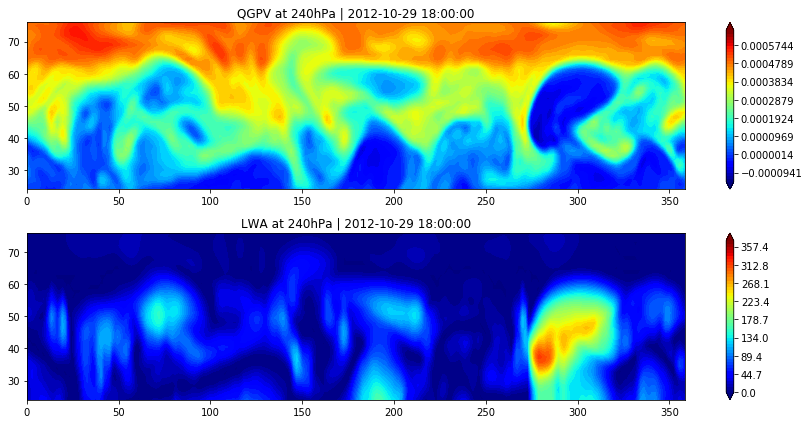

tstep = 55/124



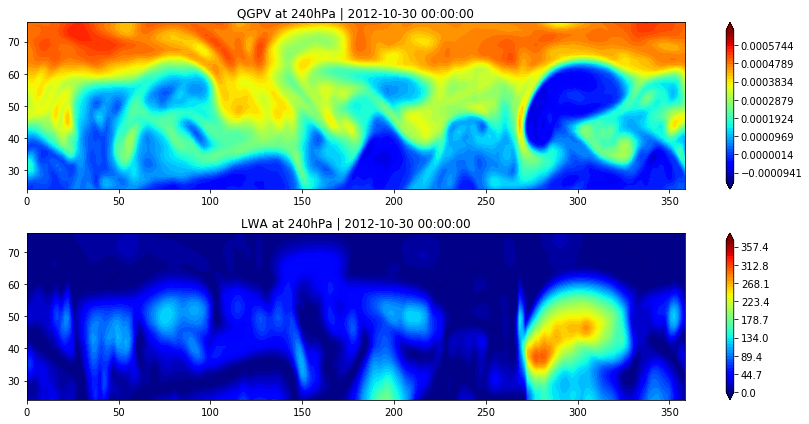

tstep = 56/124



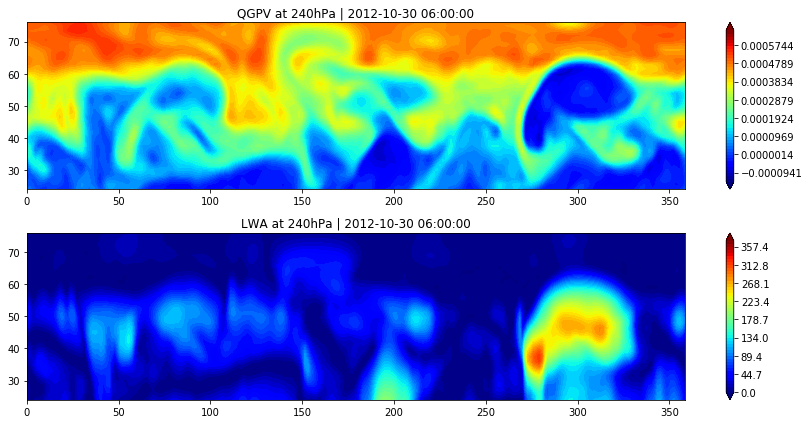

tstep = 57/124



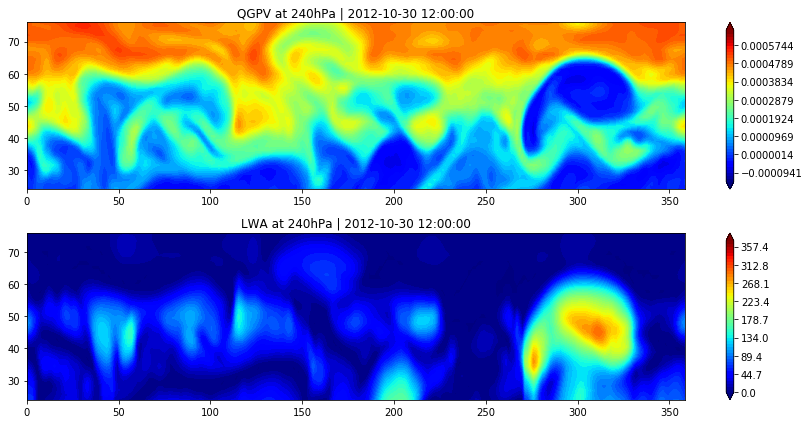

tstep = 58/124



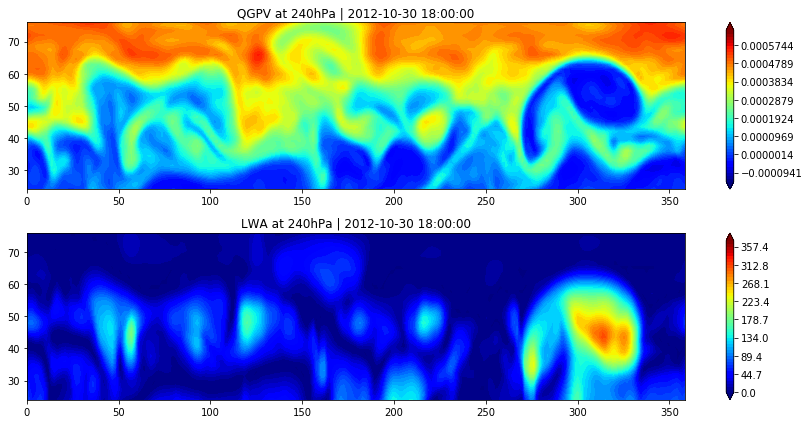

tstep = 59/124



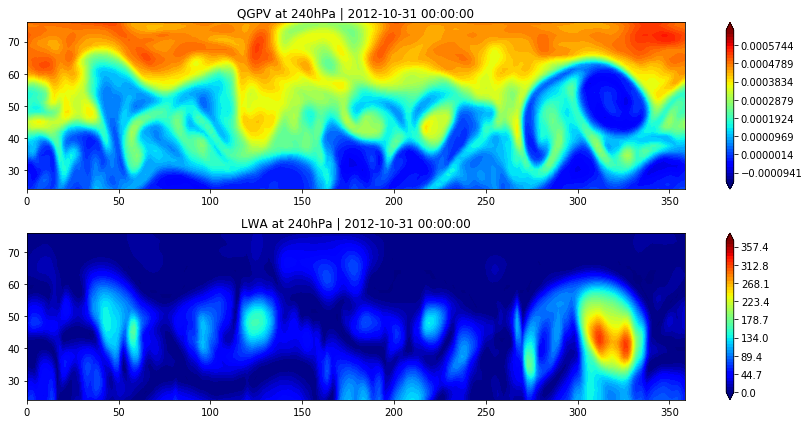

tstep = 60/124



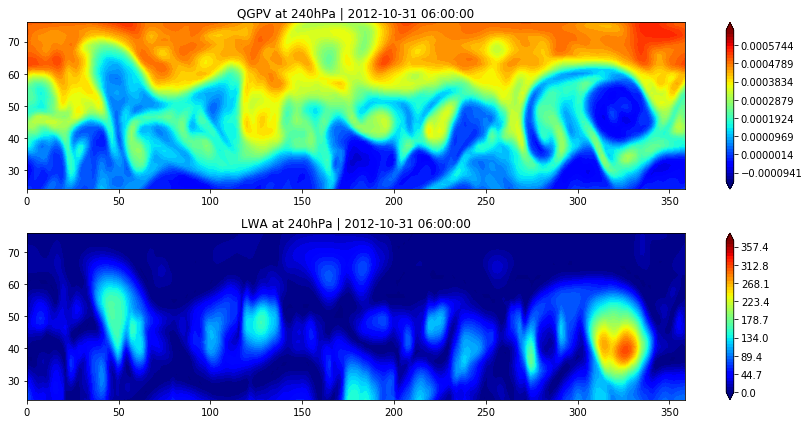

tstep = 61/124



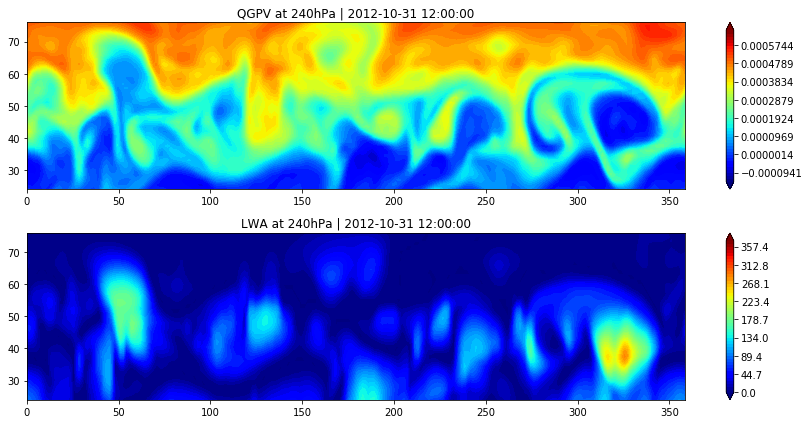

tstep = 62/124



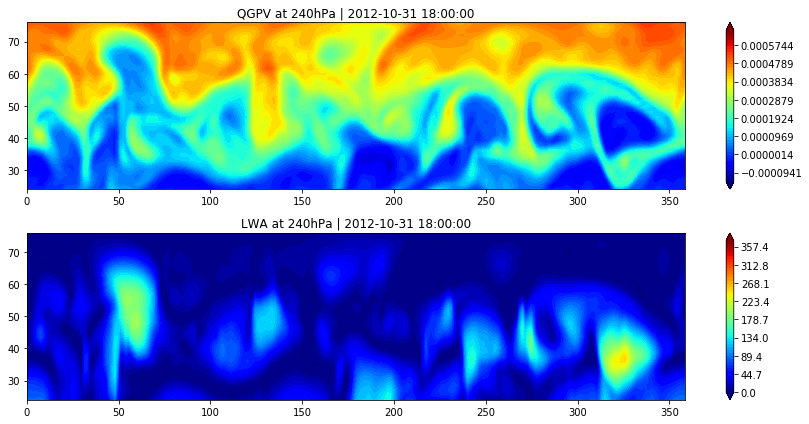

tstep = 63/124



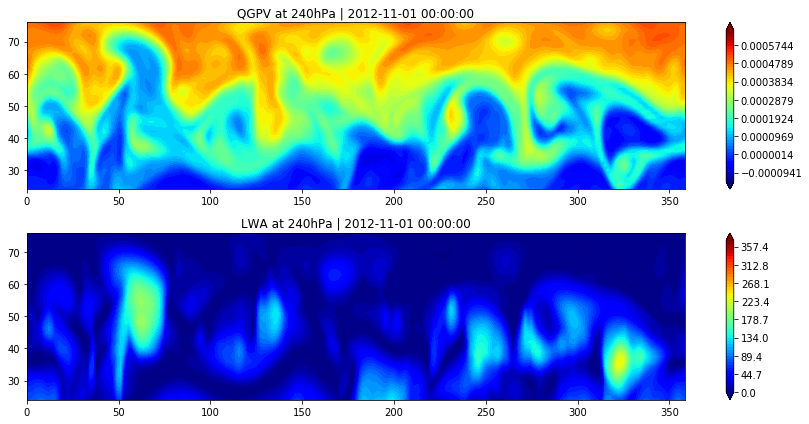

tstep = 64/124



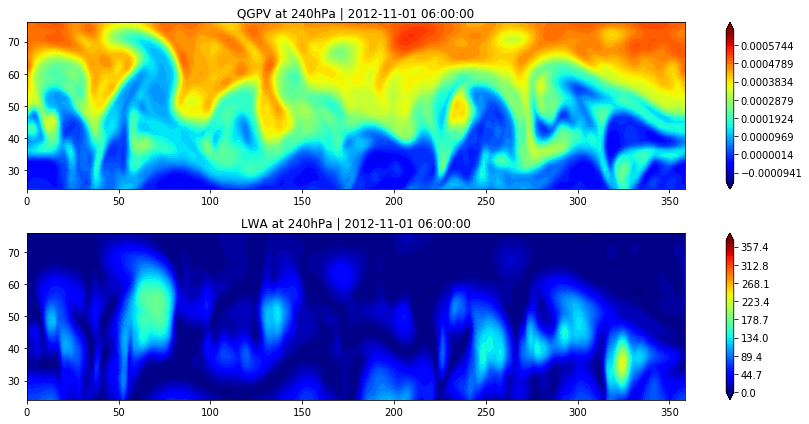

tstep = 65/124



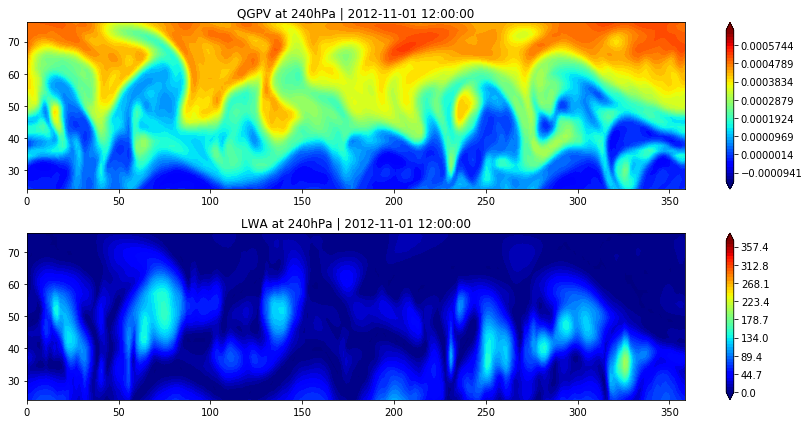

tstep = 66/124



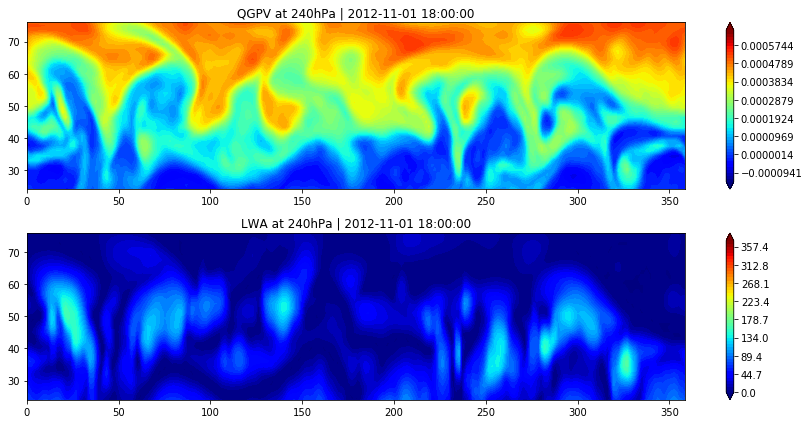

tstep = 67/124



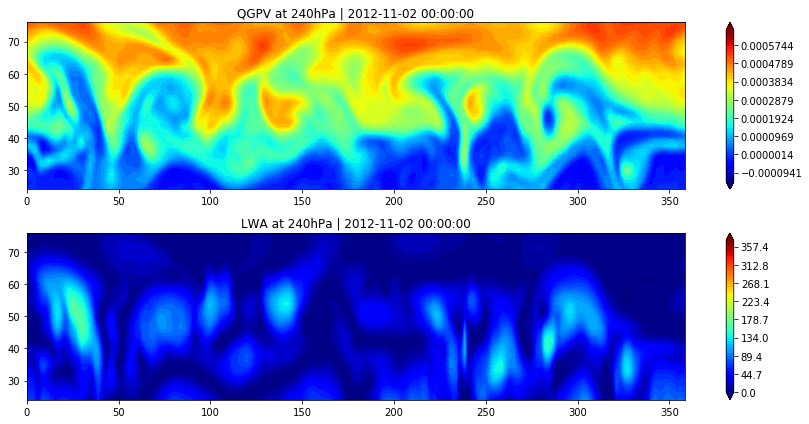

tstep = 68/124



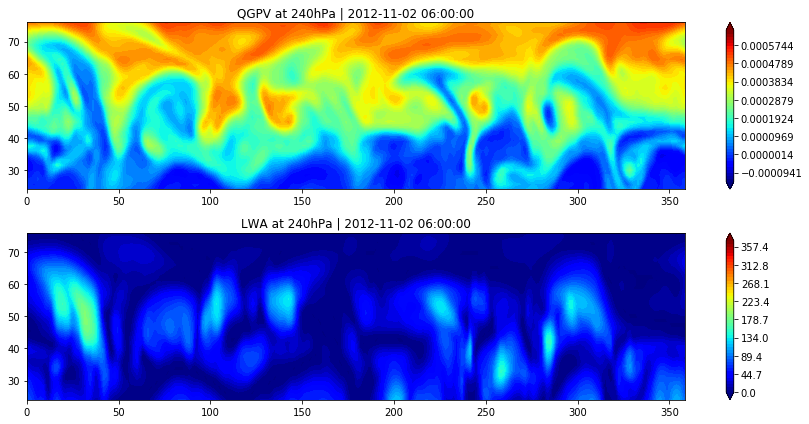

tstep = 69/124



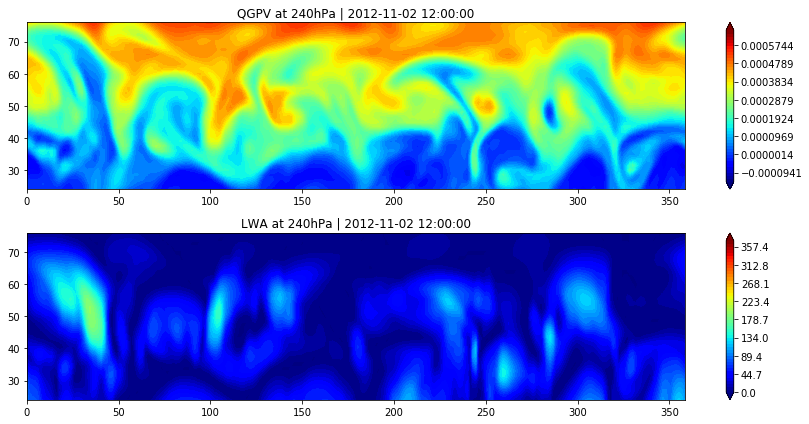

tstep = 70/124



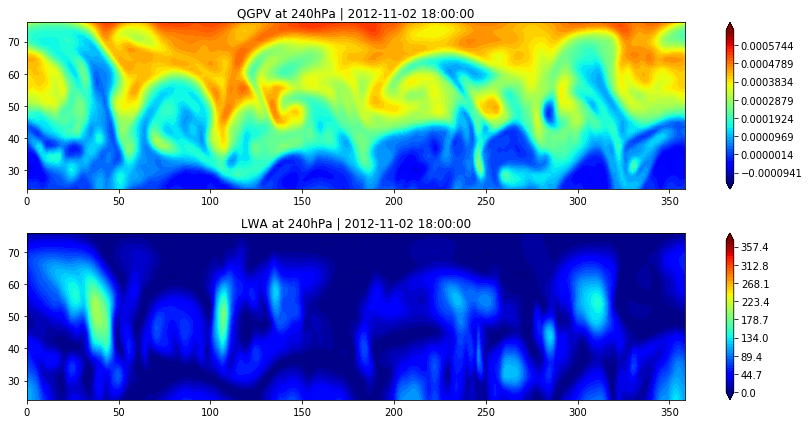

tstep = 71/124



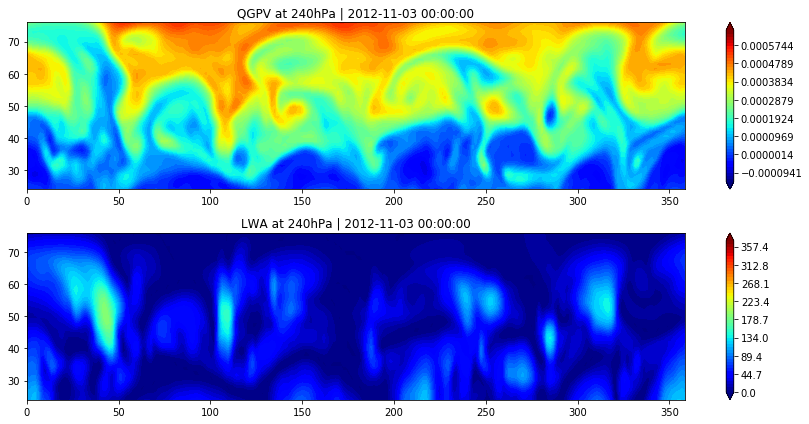

tstep = 72/124



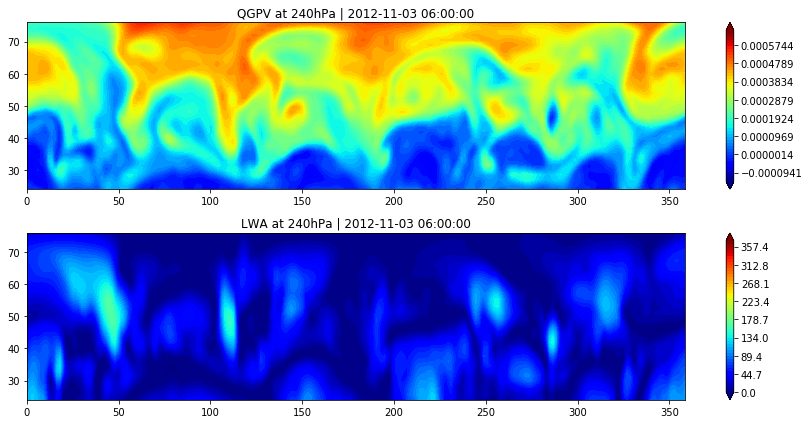

tstep = 73/124



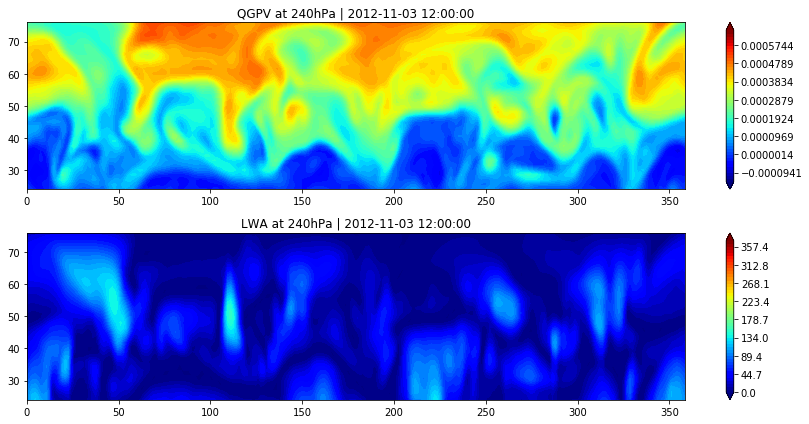

tstep = 74/124



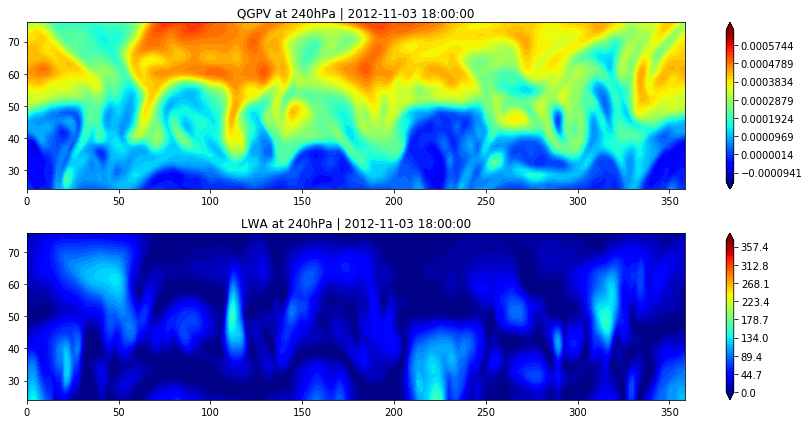

tstep = 75/124



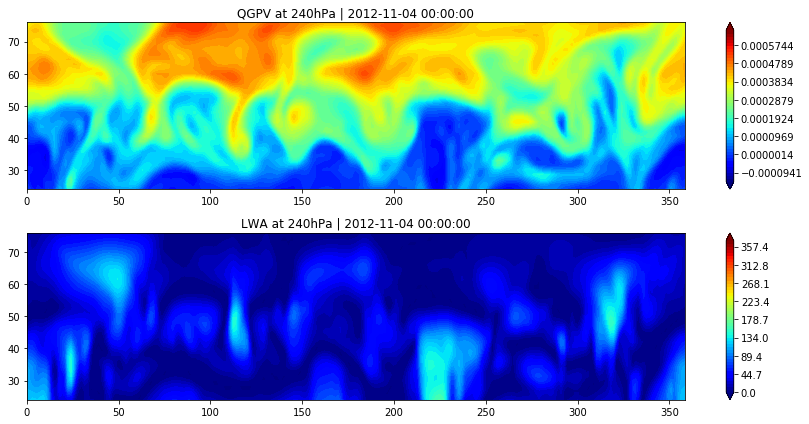

tstep = 76/124



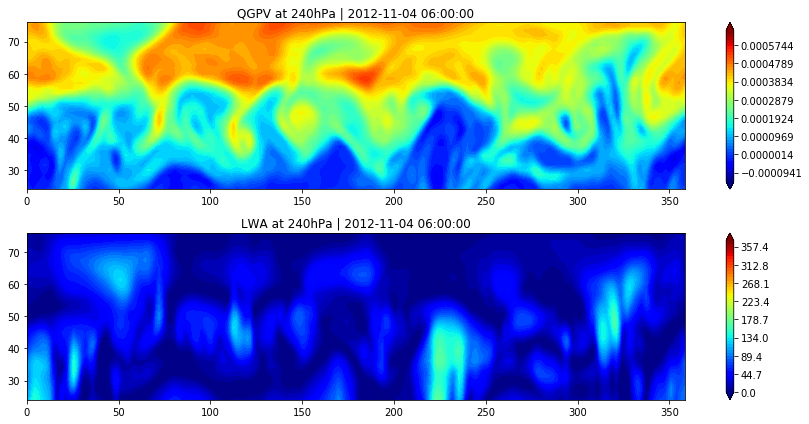

tstep = 77/124



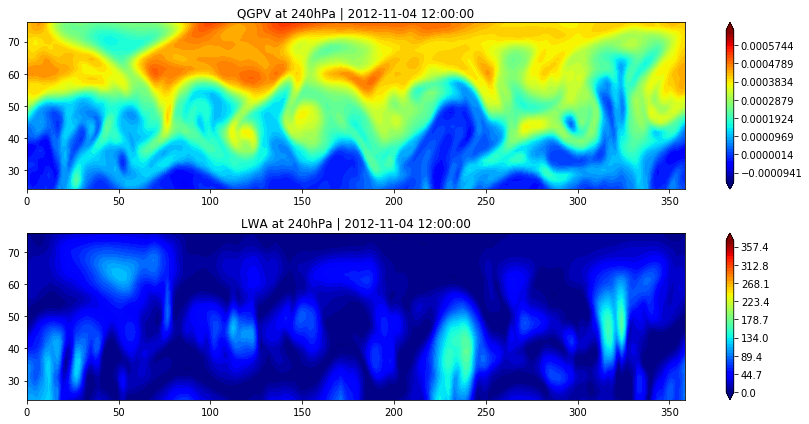

tstep = 78/124



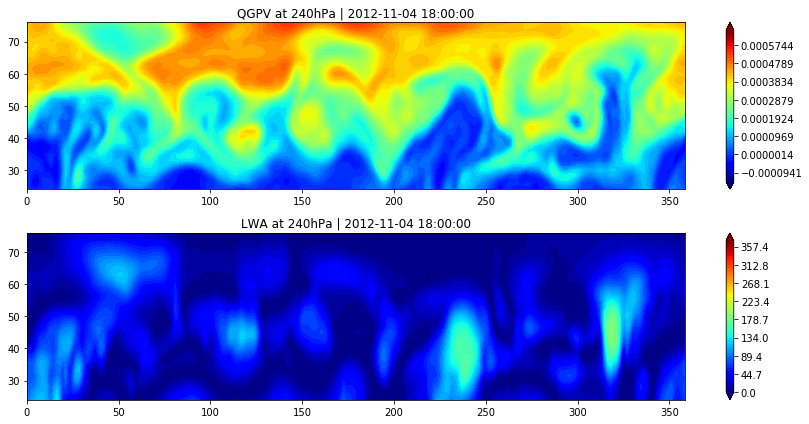

tstep = 79/124



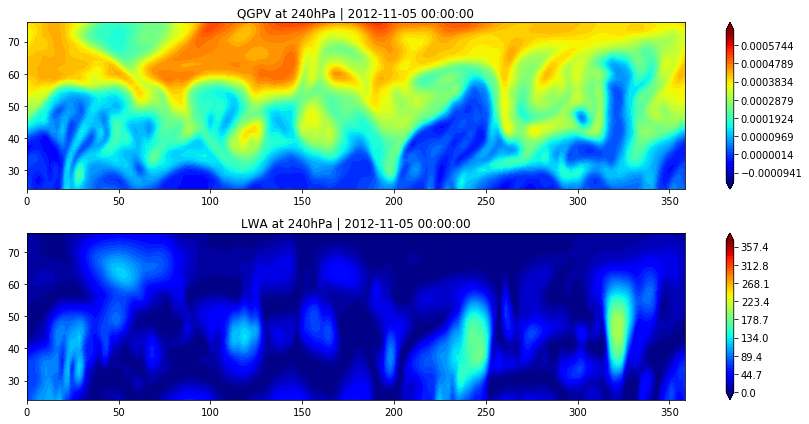

tstep = 80/124



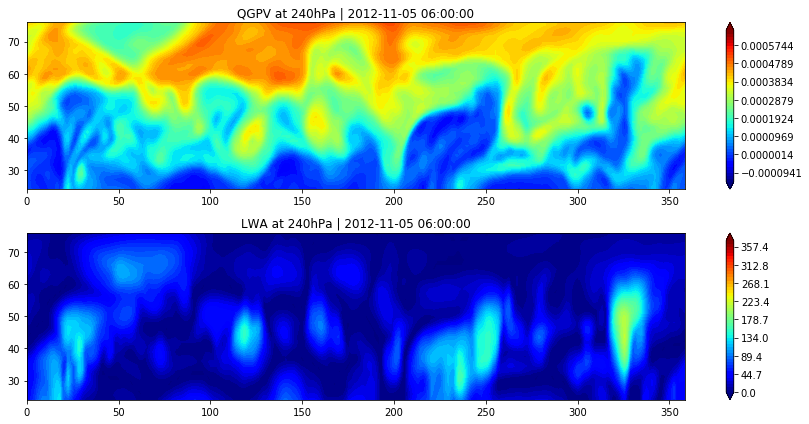

tstep = 81/124



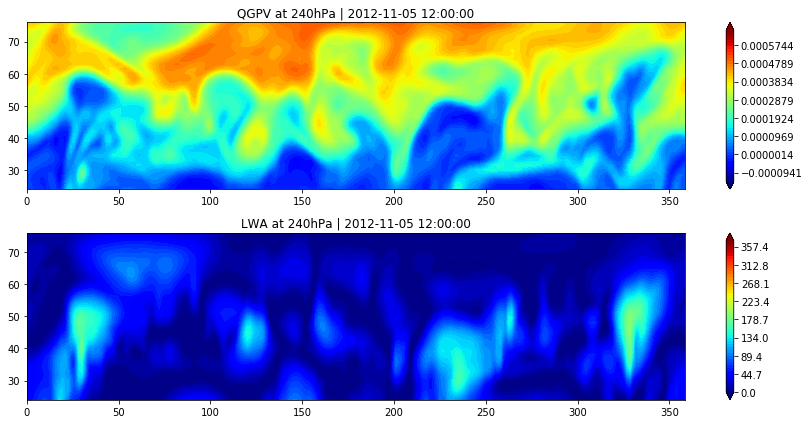

tstep = 82/124



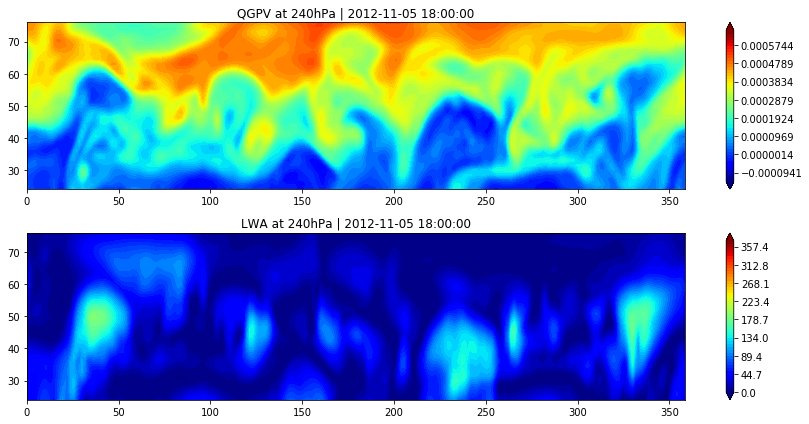

tstep = 83/124



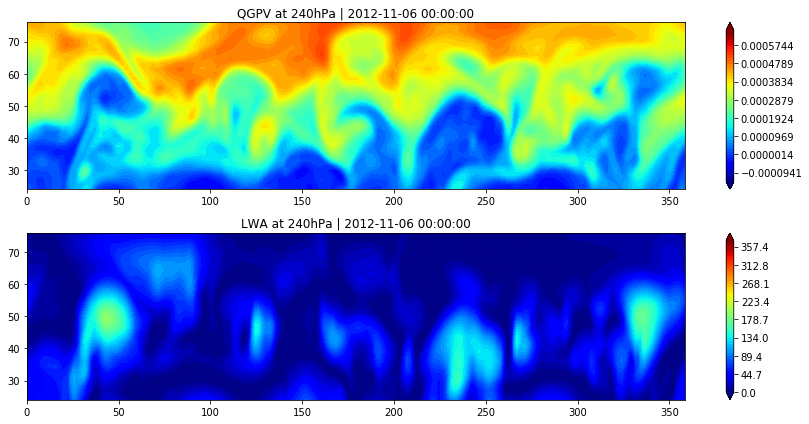

tstep = 84/124



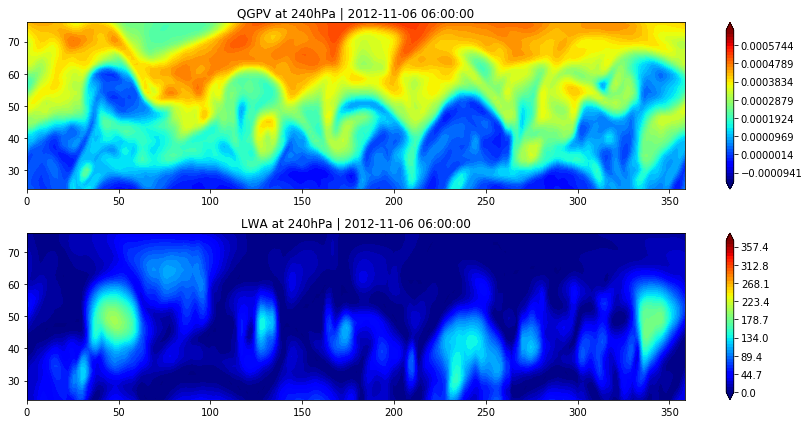

tstep = 85/124



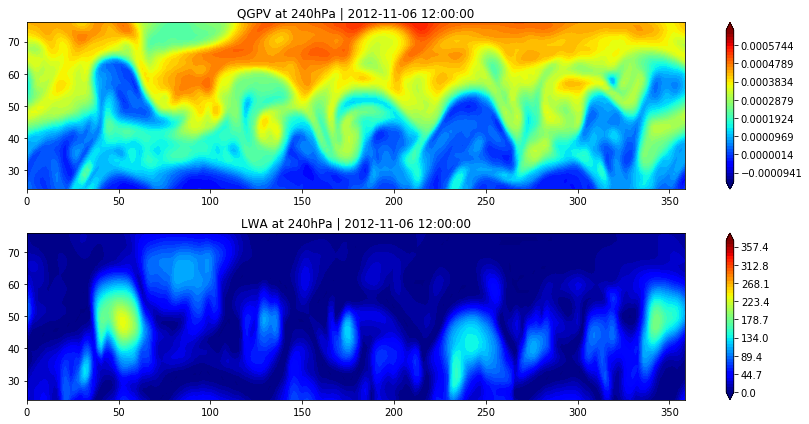

tstep = 86/124



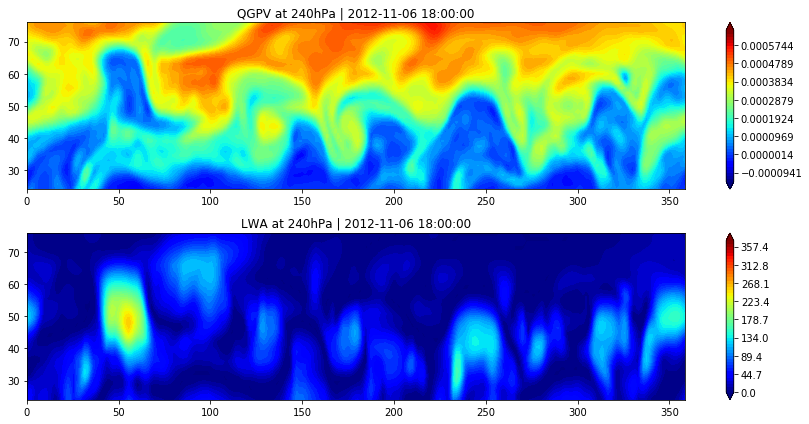

tstep = 87/124



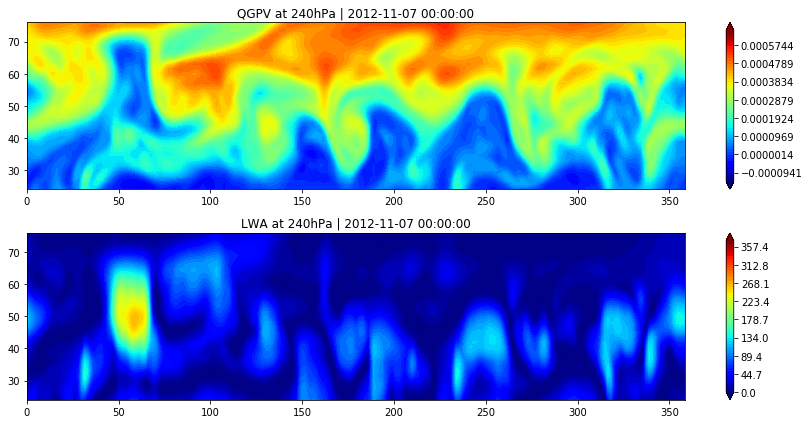

tstep = 88/124



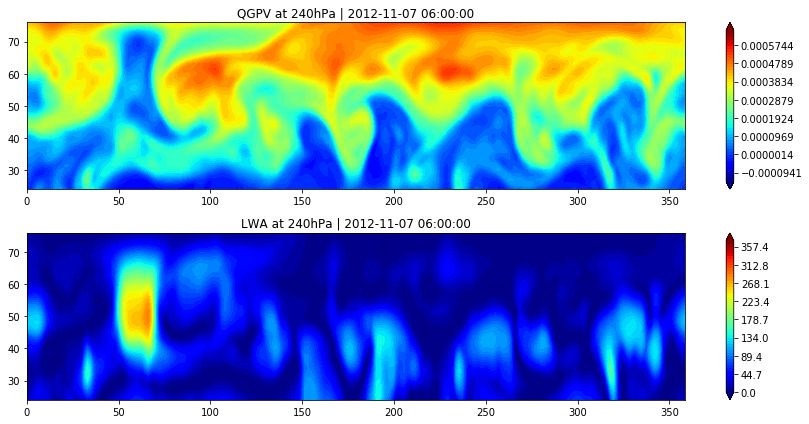

tstep = 89/124



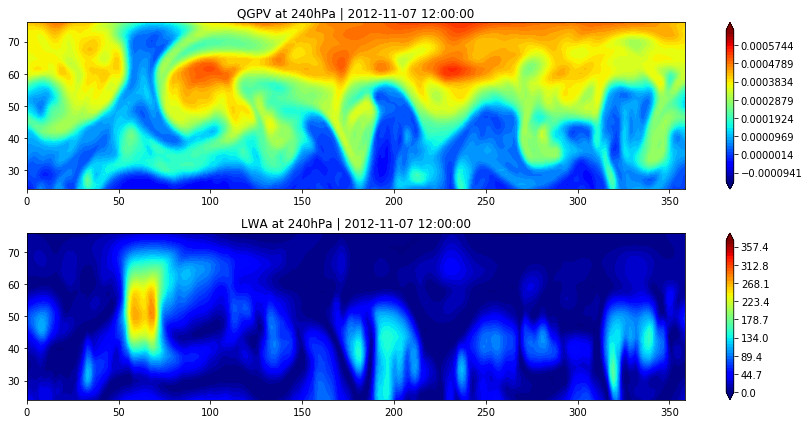

tstep = 90/124



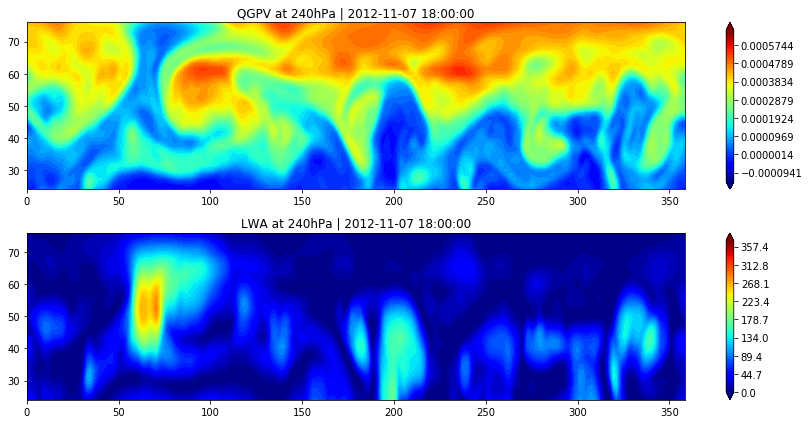

tstep = 91/124



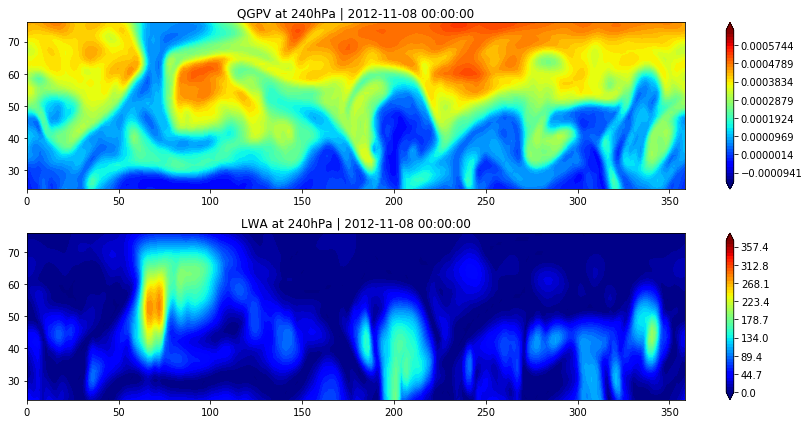

tstep = 92/124



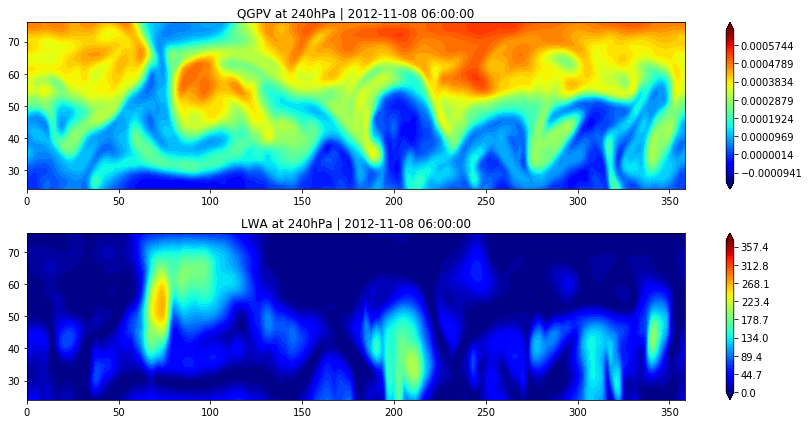

tstep = 93/124



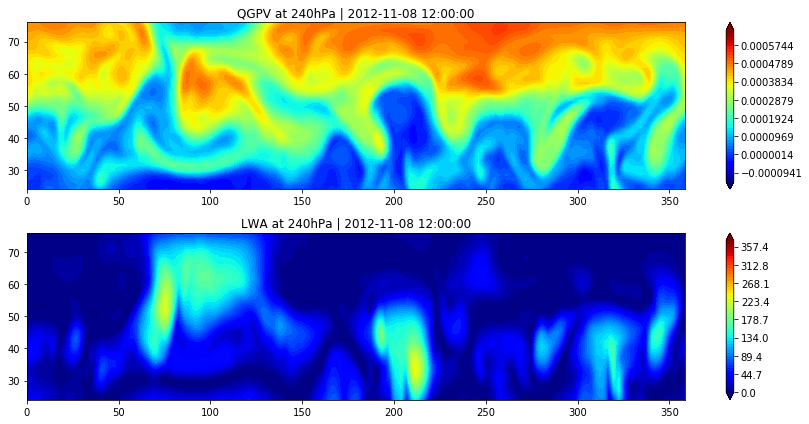

tstep = 94/124



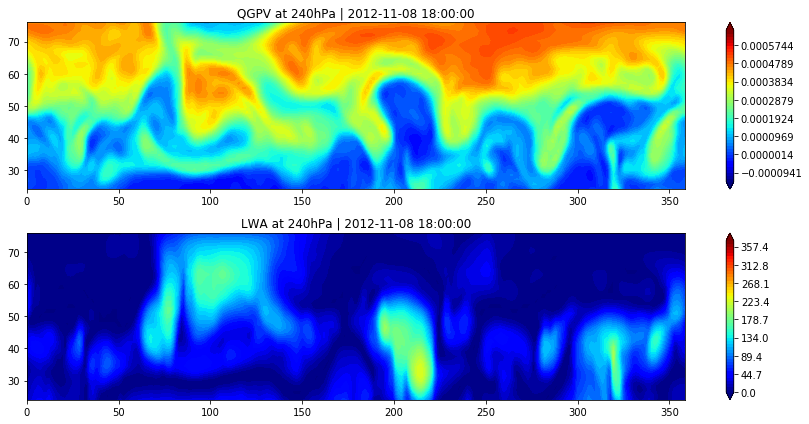

tstep = 95/124



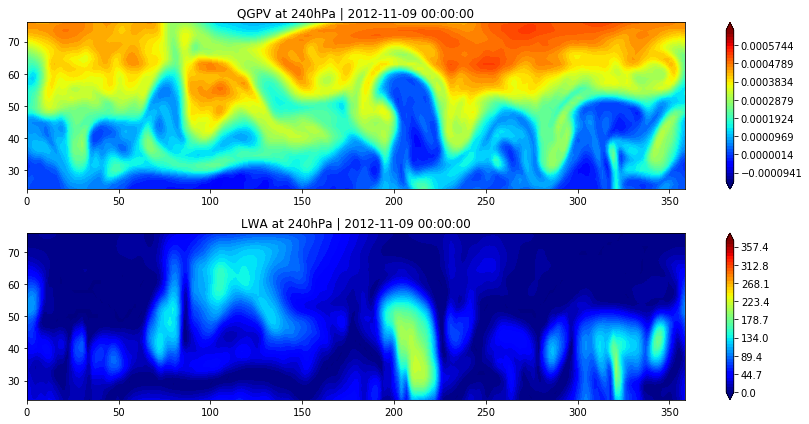

tstep = 96/124



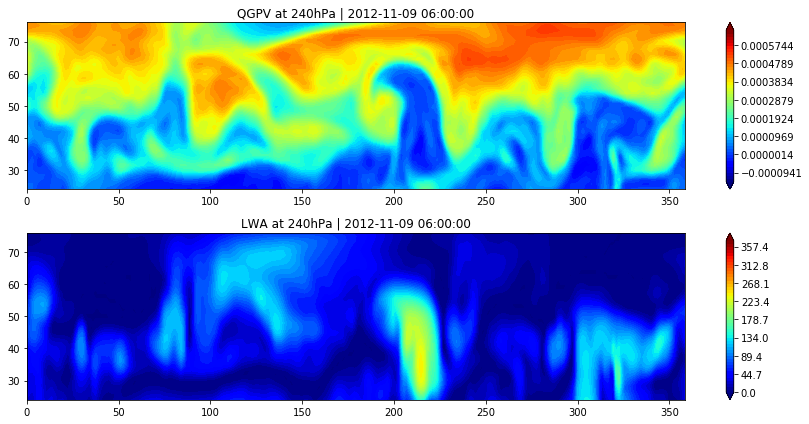

tstep = 97/124



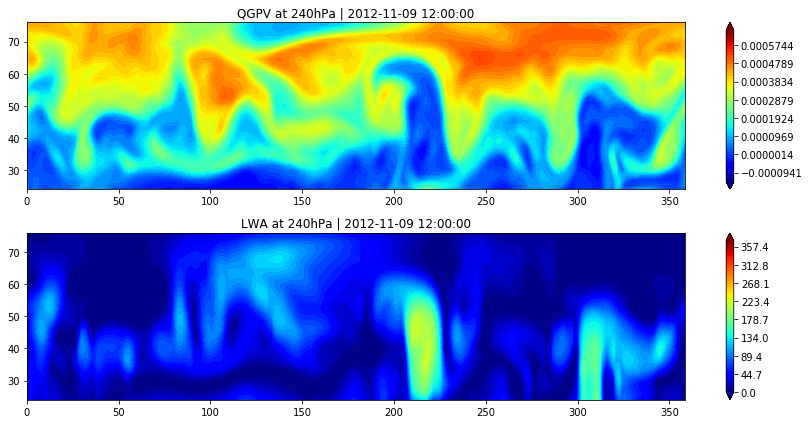

tstep = 98/124



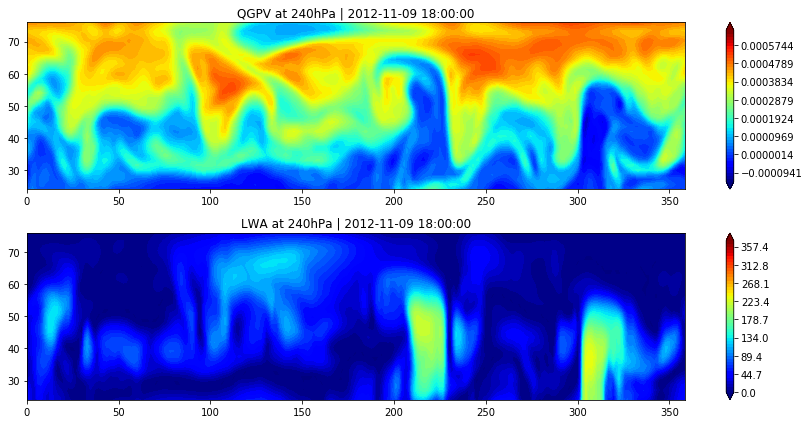

tstep = 99/124



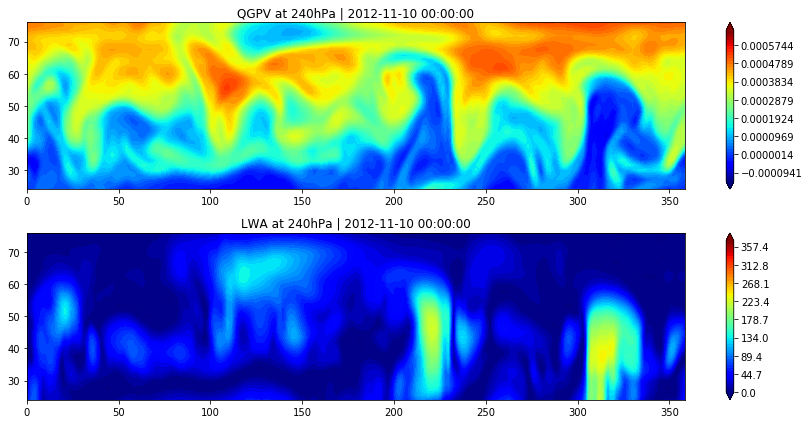

tstep = 100/124



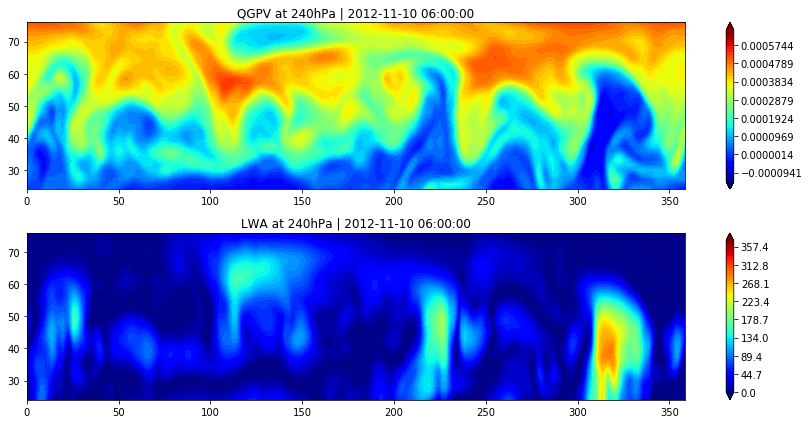

tstep = 101/124



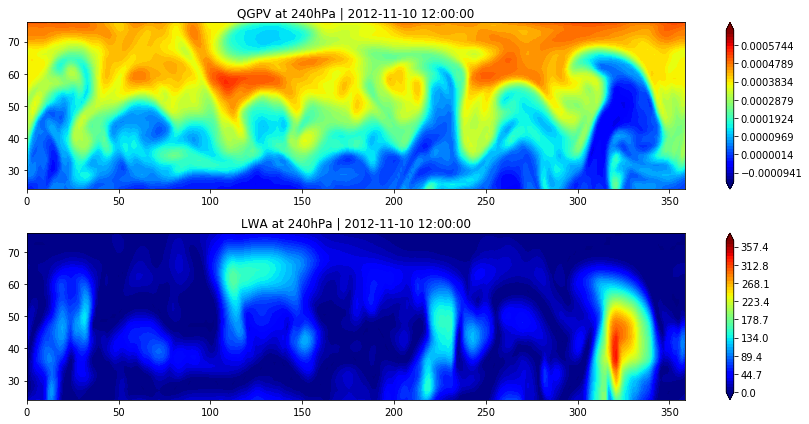

tstep = 102/124



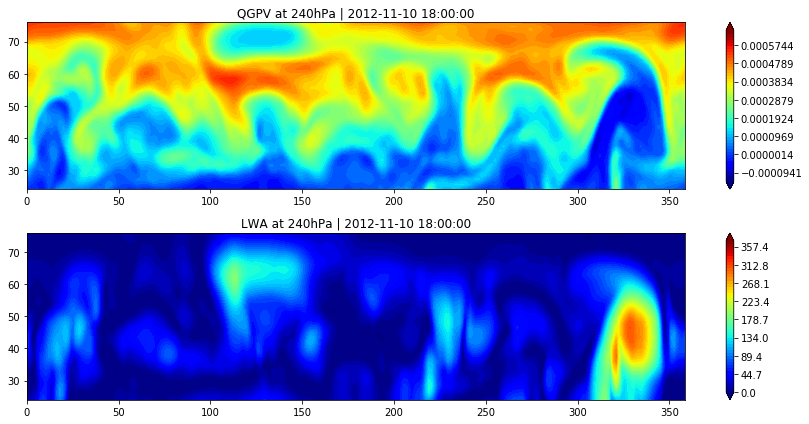

tstep = 103/124



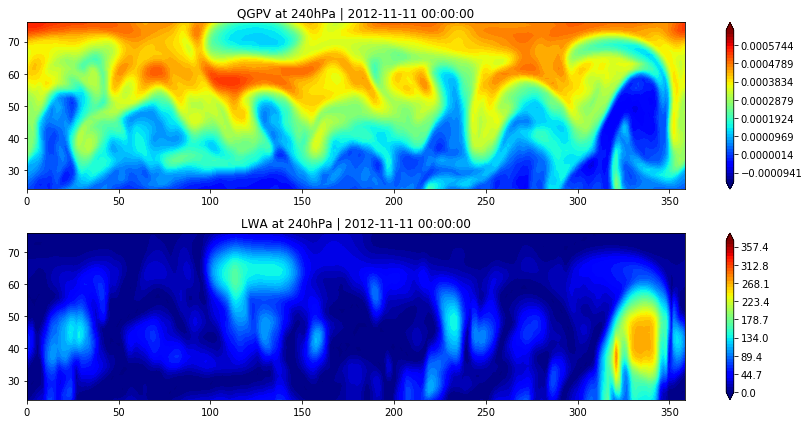

tstep = 104/124



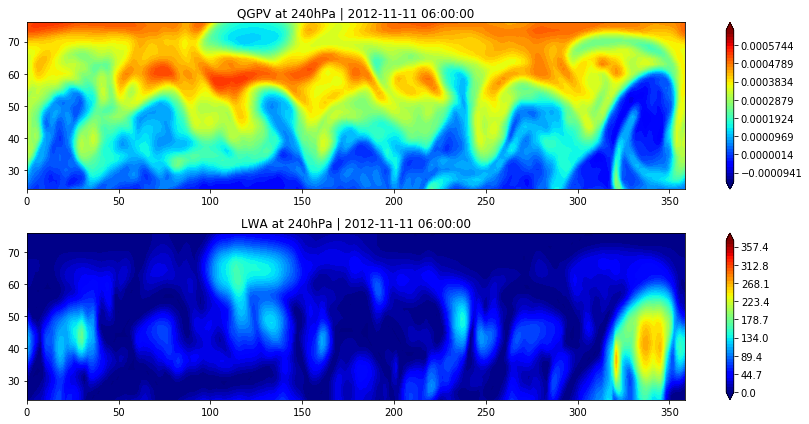

tstep = 105/124



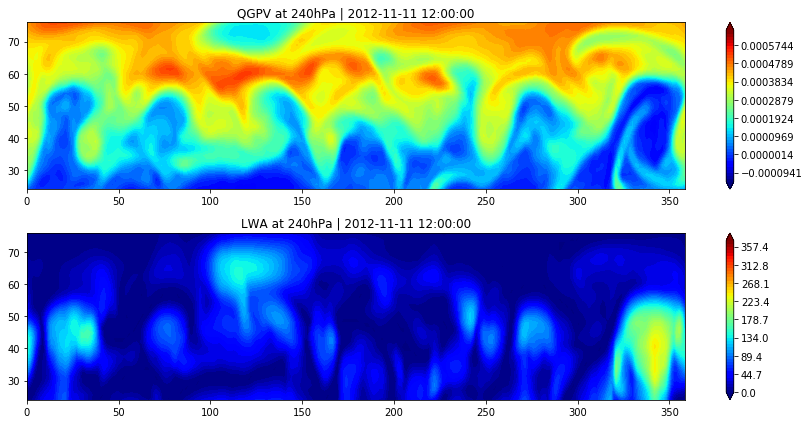

tstep = 106/124



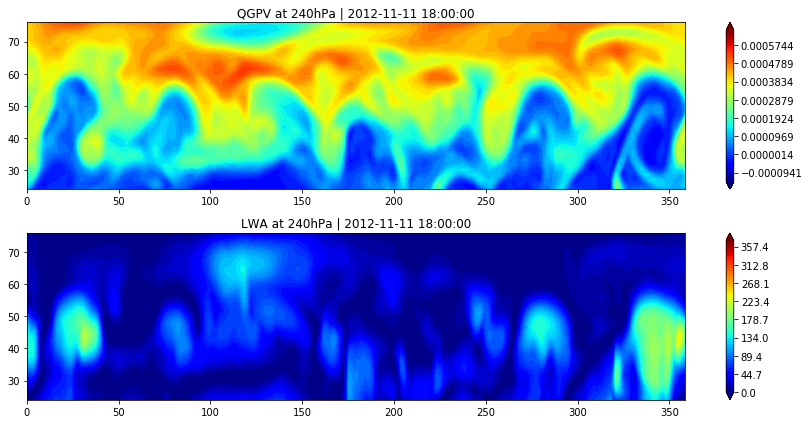

tstep = 107/124



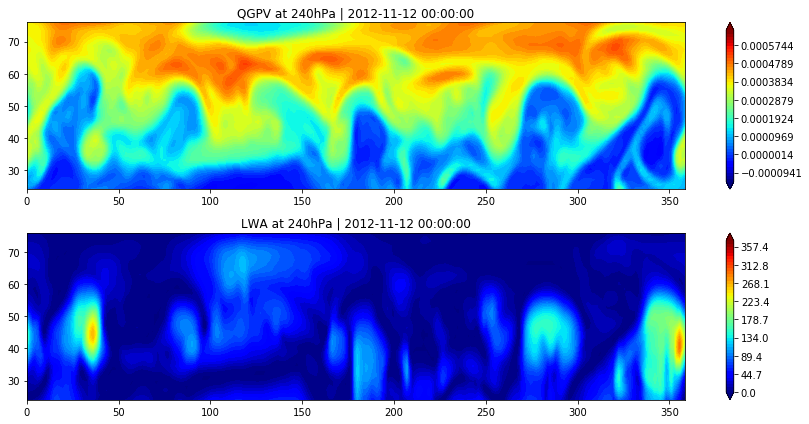

tstep = 108/124



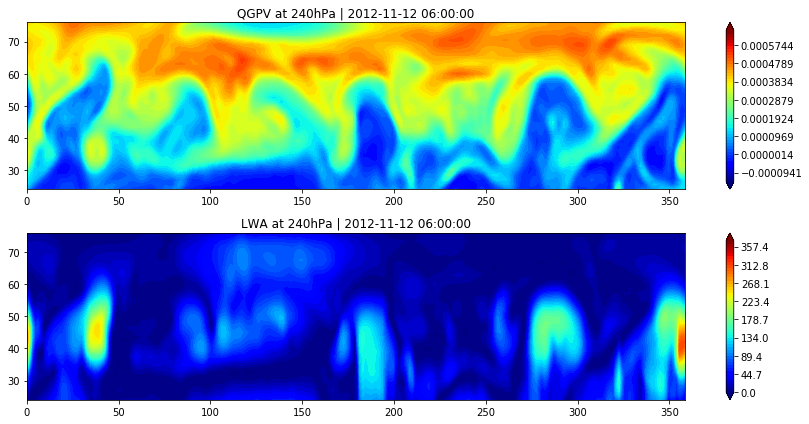

tstep = 109/124



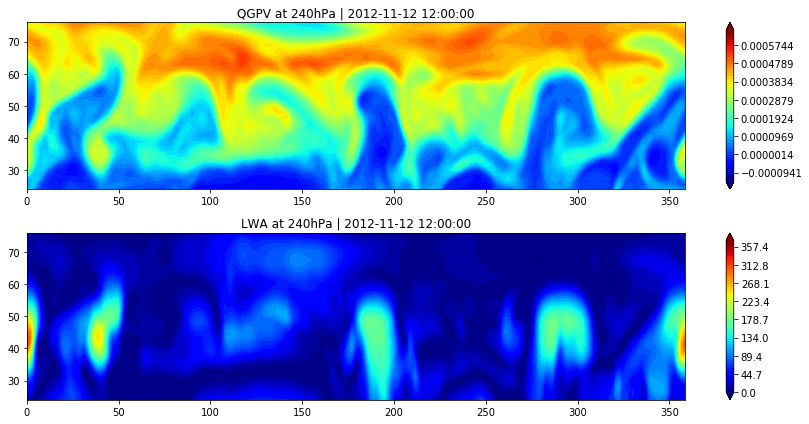

tstep = 110/124



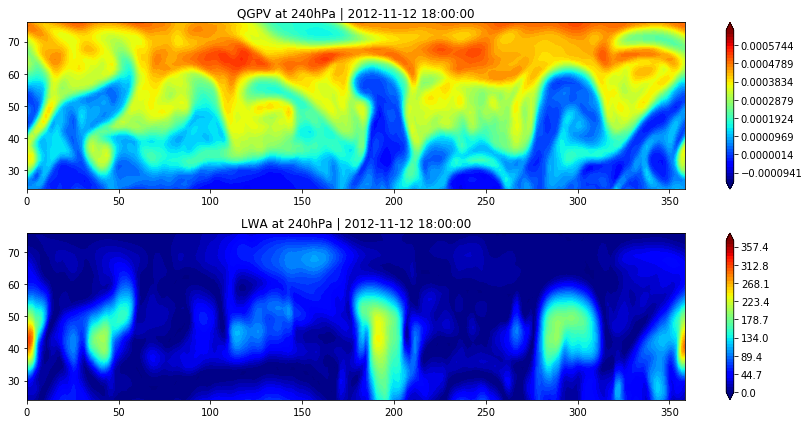

tstep = 111/124



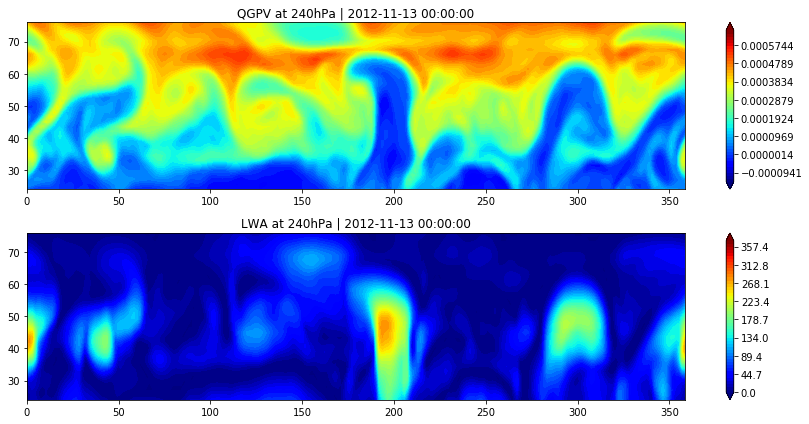

tstep = 112/124



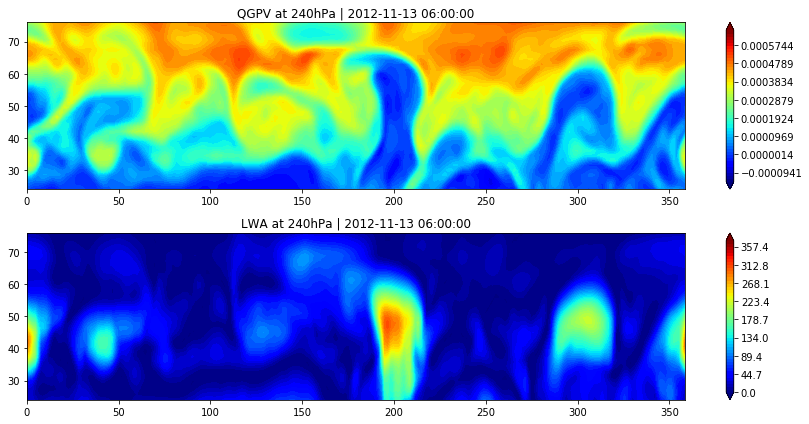

tstep = 113/124



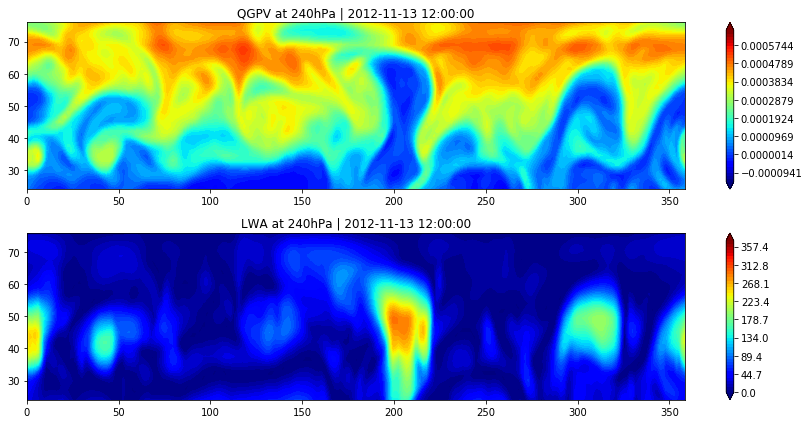

tstep = 114/124



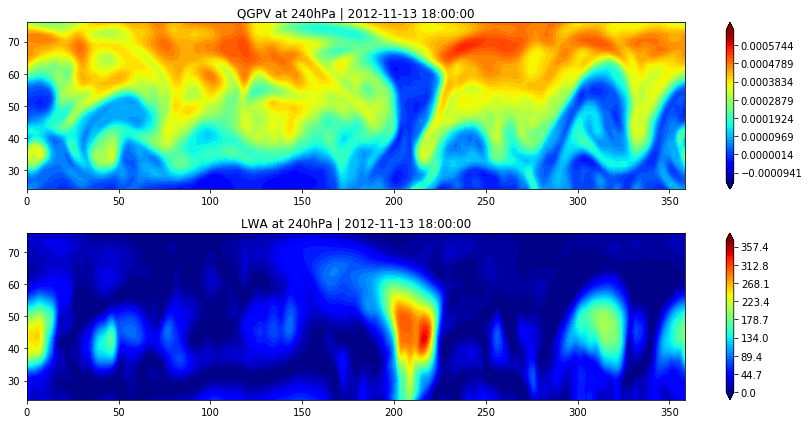

tstep = 115/124



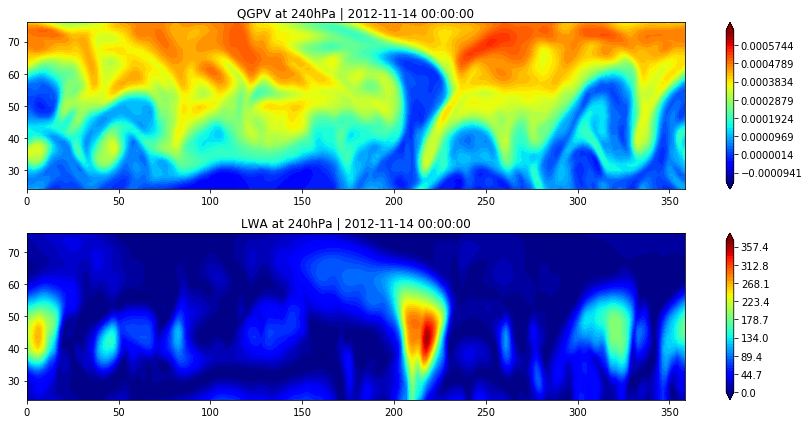

tstep = 116/124



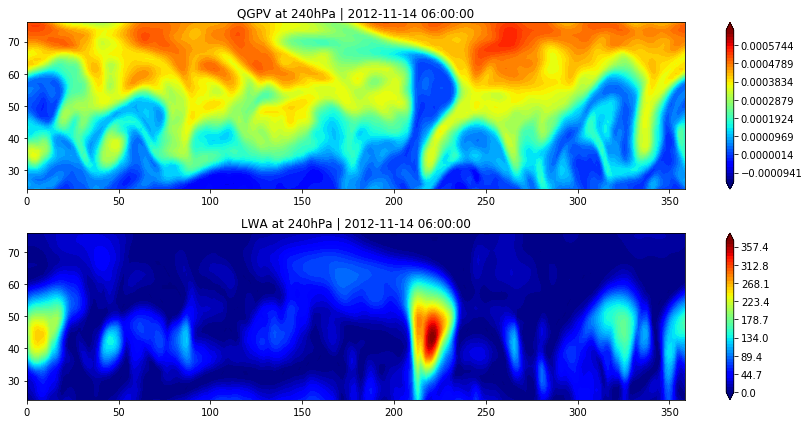

tstep = 117/124



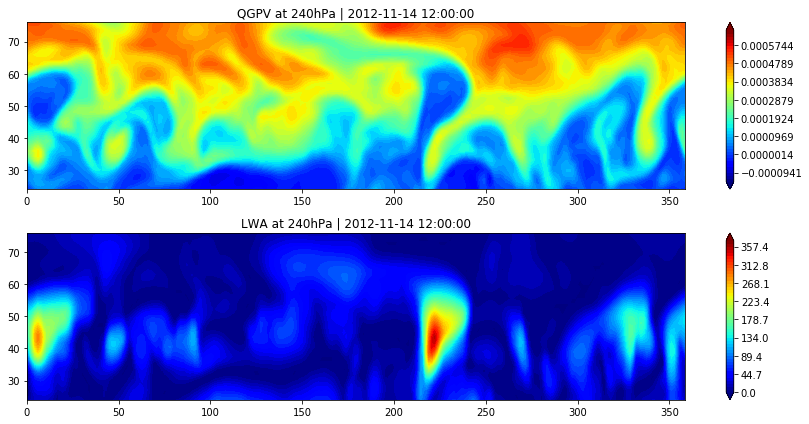

tstep = 118/124



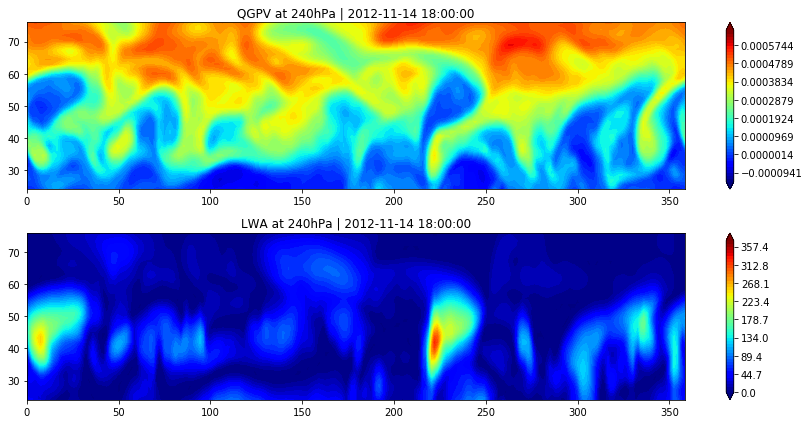

tstep = 119/124



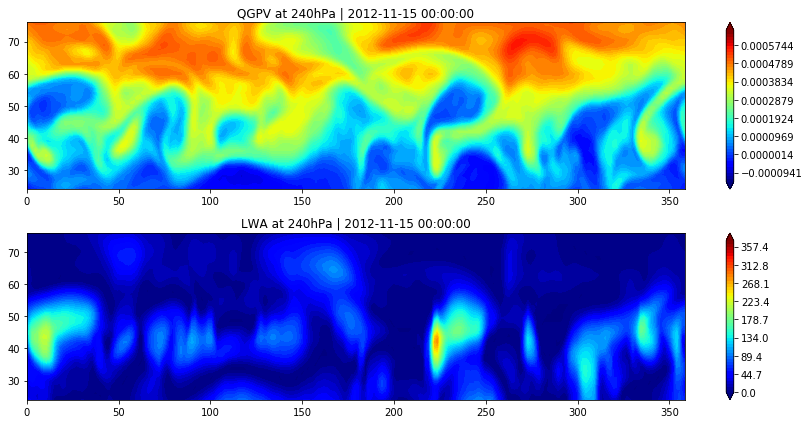

tstep = 120/124



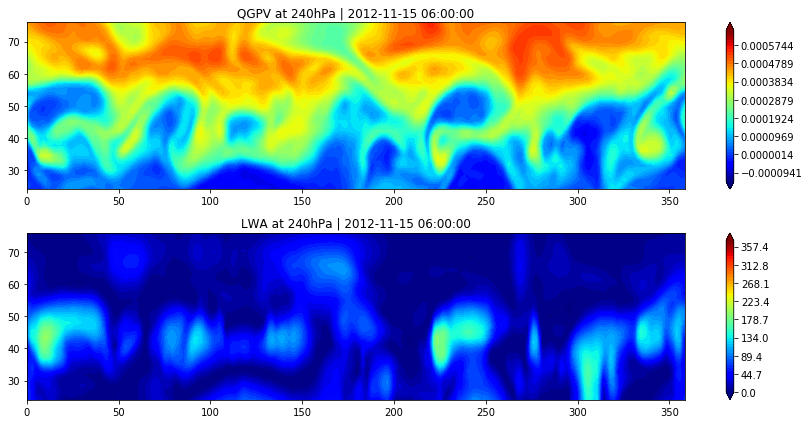

tstep = 121/124



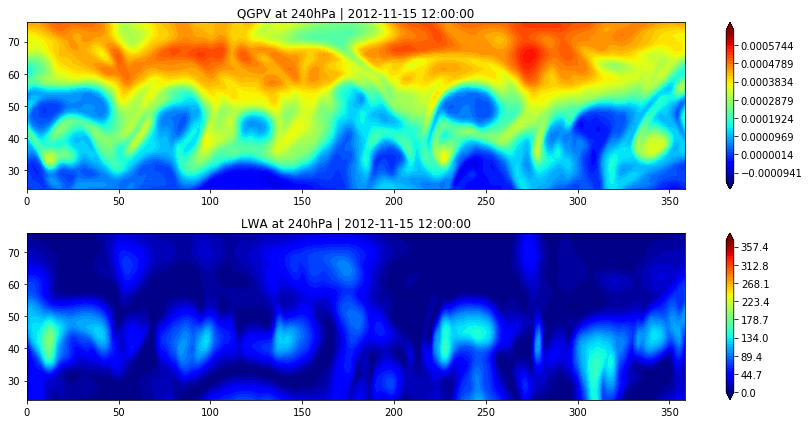

tstep = 122/124



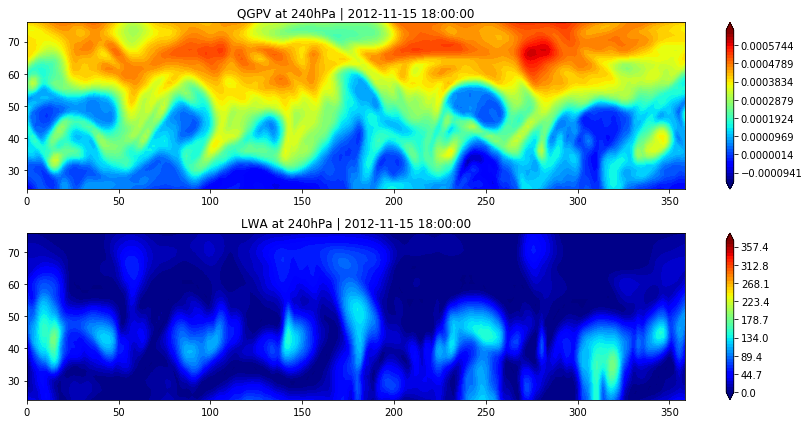

tstep = 123/124



In [17]:
for tstep in range(ntimes):
    plt.subplots(figsize=(12,6))
    # *** QGPV at 240 hPa ***
    plt.subplot(211)
    plt.contourf(xlon, ylat[(nlat//2):-1], qgpv[tstep, plev_selected, (nlat//2):-1, :], qgpv_cscale, cmap='jet', extend="both")
    plt.colorbar()
    plt.ylim(24, 76)
    plt.title('QGPV at 240hPa | ' + str(tstamp[tstep]))
    # *** LWA at 240 hPa ***
    plt.subplot(212)
    plt.contourf(xlon, ylat[(nlat//2):-1], lwa[tstep, plev_selected, (nlat//2):-1, :], lwa_cscale, cmap='jet', extend="both")
    plt.colorbar()
    plt.ylim(24, 76)
    plt.title('LWA at 240hPa | ' + str(tstamp[tstep]))
    plt.tight_layout()
    plt.savefig('output_graphs/lwa_qgpv_240hPa_{}.png'.format(tstamp[tstep].strftime(format='%Y_%m_%d_%H')))
    plt.show()
    print('tstep = {}/{}\n'.format(tstep, ntimes))


In [18]:
close_file = True
if close_file:
    output_file.close()
    print('Output {} timesteps of data to the file {}'.format(ntimes, output_fname))

Output 124 timesteps of data to the file 2012-10-16_to_2012-11-15_output_20190907.nc
